In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [2]:
all_data = pd.read_csv("all_merged_data.csv")

In [3]:
all_data.head()

,time,local_time,t2m,prectotland,precsnoland,snomas,rhoa,swgdn,swtdn,cldtot,wind_speed,quarter,month,month_name,day,hour
0,2015-01-01 00:00:00,2015-01-01 00:00,7.742,0.023,0.0,0.017,1.259,0.0,0.0,0.994,8.747,1,1,January,1,0
1,2015-01-01 01:00:00,2015-01-01 01:00,7.768,0.029,0.0,0.016,1.259,0.0,0.0,0.973,8.576,1,1,January,1,1
2,2015-01-01 02:00:00,2015-01-01 02:00,7.974,0.035,0.0,0.015,1.257,0.0,0.0,0.936,9.216,1,1,January,1,2
3,2015-01-01 03:00:00,2015-01-01 03:00,8.486,0.052,0.0,0.013,1.255,0.0,0.0,0.928,9.385,1,1,January,1,3
4,2015-01-01 04:00:00,2015-01-01 04:00,8.867,0.050,0.0,0.012,1.253,0.0,0.0,0.988,9.575,1,1,January,1,4


In [4]:
all_data['time'] = pd.to_datetime(all_data['time'])

In [5]:
all_data['year'] = all_data['time'].dt.year

In [6]:
all_data

,time,local_time,t2m,prectotland,precsnoland,snomas,rhoa,swgdn,swtdn,cldtot,wind_speed,quarter,month,month_name,day,hour,year
0,2015-01-01 00:00:00,2015-01-01 00:00,7.742,0.023,0.0,0.017,1.259,0.0,0.0,0.994,8.747,1,1,January,1,0,2015
1,2015-01-01 01:00:00,2015-01-01 01:00,7.768,0.029,0.0,0.016,1.259,0.0,0.0,0.973,8.576,1,1,January,1,1,2015
2,2015-01-01 02:00:00,2015-01-01 02:00,7.974,0.035,0.0,0.015,1.257,0.0,0.0,0.936,9.216,1,1,January,1,2,2015
3,2015-01-01 03:00:00,2015-01-01 03:00,8.486,0.052,0.0,0.013,1.255,0.0,0.0,0.928,9.385,1,1,January,1,3,2015
4,2015-01-01 04:00:00,2015-01-01 04:00,8.867,0.050,0.0,0.012,1.253,0.0,0.0,0.988,9.575,1,1,January,1,4,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87667,2024-12-31 19:00:00,2024-12-31 19:00,9.768,0.104,0.0,0.000,1.231,0.0,0.0,0.985,13.394,4,12,December,31,19,2024
87668,2024-12-31 20:00:00,2024-12-31 20:00,9.777,0.085,0.0,0.000,1.230,0.0,0.0,0.989,13.529,4,12,December,31,20,2024
87669,2024-12-31 21:00:00,2024-12-31 21:00,9.753,0.115,0.0,0.000,1.230,0.0,0.0,0.985,13.616,4,12,December,31,21,2024
87670,2024-12-31 22:00:00,2024-12-31 22:00,9.718,0.191,0.0,0.000,1.229,0.0,0.0,0.983,13.584,4,12,December,31,22,2024


In [7]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_time_series_by_year(df, time_col, value_col, title=None):
    """
    Plots a time series column by year in 5x2 subplots (for years 2015–2024).

    Parameters:
    - df: pandas DataFrame
    - time_col: name of the datetime column
    - value_col: name of the column to plot
    - title: optional plot title (default is value_col name)
    """
    # Ensure datetime format
    df[time_col] = pd.to_datetime(df[time_col])

    # Set default title
    if title is None:
        title = value_col

    # Filter years 2015 to 2024
    years = list(range(2015, 2025))
    fig, axes = plt.subplots(5, 2, figsize=(15, 20), sharey=True)
    axes = axes.flatten()

    for i, year in enumerate(years):
        ax = axes[i]
        year_data = df[df[time_col].dt.year == year]
        ax.plot(year_data[time_col], year_data[value_col])
        ax.set_title(f"{year}")
        ax.grid(True)

    # Hide any unused subplots (if any)
    for j in range(len(years), len(axes)):
        axes[j].axis('off')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


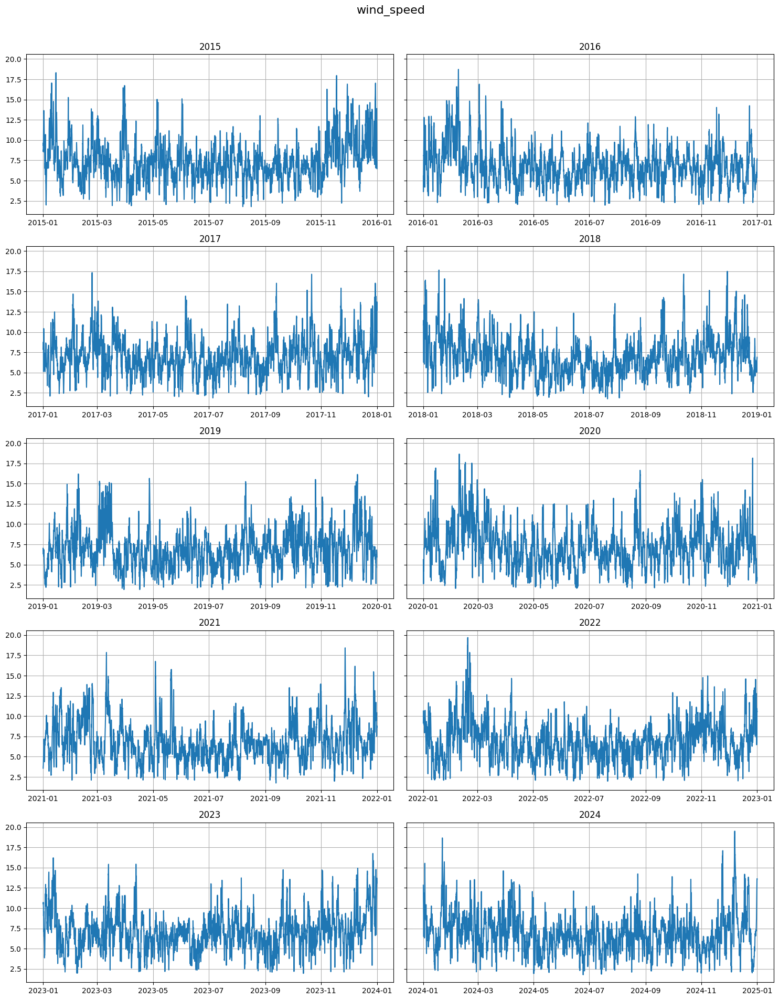

In [ ]:
plot_time_series_by_year(all_data, time_col='time', value_col='wind_speed')

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_time_series_by_year(df, time_col, value_col, title=None):
    """
    Plots a time series column by year in 10x1 subplots (2015–2024).

    Parameters:
    - df: pandas DataFrame
    - time_col: name of the datetime column
    - value_col: name of the column to plot
    - title: optional overall title (defaults to value_col)
    """
    # Ensure datetime column is in datetime format
    df[time_col] = pd.to_datetime(df[time_col])

    if title is None:
        title = value_col

    years = list(range(2015, 2025))
    fig, axes = plt.subplots(10, 1, figsize=(15, 25), sharex=False, sharey=True)

    for i, year in enumerate(years):
        ax = axes[i]
        year_data = df[df[time_col].dt.year == year]
        ax.plot(year_data[time_col], year_data[value_col])
        ax.set_title(f"{year}")
        ax.grid(True)

    fig.suptitle(title, fontsize=18)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


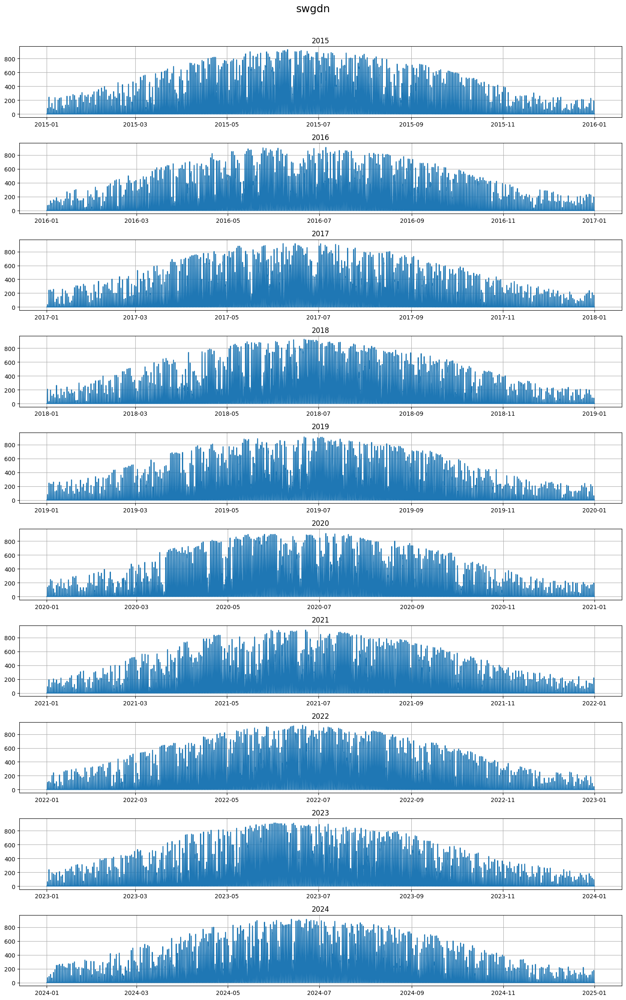

In [ ]:
plot_time_series_by_year(all_data, time_col='time', value_col='swgdn')

# 1. Dont use weather data

## Prepare Data

In [8]:
df = all_data.copy()

In [9]:
df = df.dropna()

In [10]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

def prepare_timeseries_data(df, input_hours=24, forecast_horizon=2, scaler=None):
    """
    Prepare supervised learning data for time series forecasting with scaling.

    Parameters:
        df (pd.DataFrame): Your original dataframe with a 'swgdn' column.
        input_hours (int): Number of past hours used as input.
        forecast_horizon (int): How many hours ahead to predict.
        scaler: An optional sklearn scaler. If None, a new MinMaxScaler will be used.

    Returns:
        X (np.ndarray): Input sequences of shape (samples, input_hours)
        y (np.ndarray): Output target values (samples,)
        fitted_scaler: The fitted scaler object (useful for inverse transforming predictions)
    """
    if scaler is None:
        scaler = MinMaxScaler()

    # Reshape for scaler and fit_transform
    swgdn_values = df['swgdn'].values.reshape(-1, 1)
    swgdn_scaled = scaler.fit_transform(swgdn_values).flatten()

    X, y = [], []

    for i in range(len(swgdn_scaled) - input_hours - forecast_horizon + 1):
        input_seq = swgdn_scaled[i : i + input_hours]
        target_value = swgdn_scaled[i + input_hours + forecast_horizon - 1]
        X.append(input_seq)
        y.append(target_value)

    return np.array(X), np.array(y), scaler

In [11]:
def split_data(X, y, train_ratio=0.8):
    """
    Splits the input and output sequences into training and testing sets.

    Parameters:
        X (np.ndarray): Input sequences.
        y (np.ndarray): Corresponding target values.
        train_ratio (float): Fraction of data to be used for training.

    Returns:
        X_train, X_test, y_train, y_test: Split datasets.
    """
    split_point = int(len(X) * train_ratio)
    X_train, X_test = X[:split_point], X[split_point:]
    y_train, y_test = y[:split_point], y[split_point:]
    return X_train, X_test, y_train, y_test


In [ ]:
X_seq, y_seq, scaler_model = prepare_timeseries_data(df, input_hours=2*24, forecast_horizon=24)
X_train, X_test, y_train, y_test = split_data(X_seq, y_seq, train_ratio=0.8)

print(f"Train shape: {X_train.shape}, {y_train.shape}")
print(f"Test shape: {X_test.shape}, {y_test.shape}")

Train shape: (70080, 48), (70080,)
Test shape: (17520, 48), (17520,)


## test models

In [ ]:
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

y_train_scaled = y_train.copy()
y_test_scaled = y_test.copy()

# Inverse transform y values (reshaping to 2D as required by sklearn)
y_train = scaler_model.inverse_transform(y_train_scaled.reshape(-1, 1)).flatten()
y_test = scaler_model.inverse_transform(y_test_scaled.reshape(-1, 1)).flatten()


In [ ]:
y_train

array([0., 0., 0., ..., 0., 0., 0.])

In [ ]:
from sklearn.svm import SVR

svr = SVR()
svr.fit(X_train_scaled, y_train_scaled)
y_pred_svr = scaler_model.inverse_transform(svr.predict(X_test_scaled).reshape(-1, 1)).flatten()


In [ ]:
import xgboost as xgb

xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train_scaled, y_train_scaled)
y_pred_xgb = scaler_model.inverse_transform(xgb_model.predict(X_test_scaled).reshape(-1, 1)).flatten()


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import numpy as np

# Reshape for LSTM
X_train_lstm = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
X_test_lstm = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

model_lstm = Sequential([
    LSTM(32, activation='relu', input_shape=(X_train_lstm.shape[1], 1)),
    Dense(1)
])
model_lstm.compile(optimizer='adam', loss='mae')

history_lstm = model_lstm.fit(
    X_train_lstm, y_train_scaled,
    epochs=20, batch_size=32,
    validation_split=0.2,
    verbose=3
)

y_pred_lstm = scaler_model.inverse_transform(model_lstm.predict(X_test_lstm)).flatten()


Epoch 1/20


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/20
Epoch 3/20
Epoch 4/20
Epoch 5/20
Epoch 6/20
Epoch 7/20
Epoch 8/20
Epoch 9/20
Epoch 10/20
Epoch 11/20
Epoch 12/20
Epoch 13/20
Epoch 14/20
Epoch 15/20
Epoch 16/20
Epoch 17/20
Epoch 18/20
Epoch 19/20
Epoch 20/20
548/548 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step


SVR:
  MAE = 62.090
  R²  = 0.851


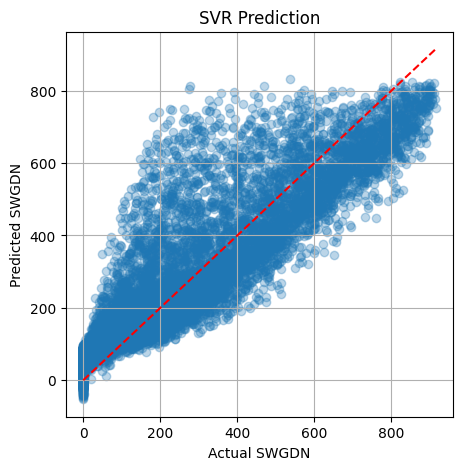

XGBoost:
  MAE = 40.354
  R²  = 0.865


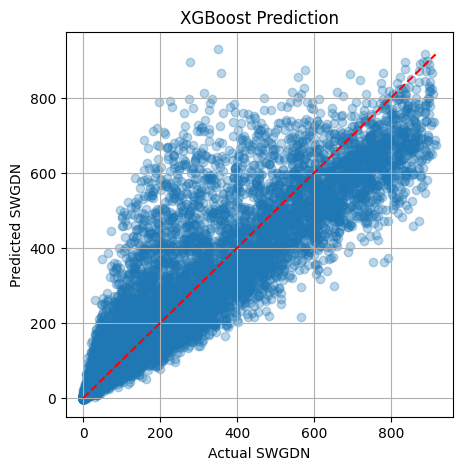

LSTM:
  MAE = 39.951
  R²  = 0.858


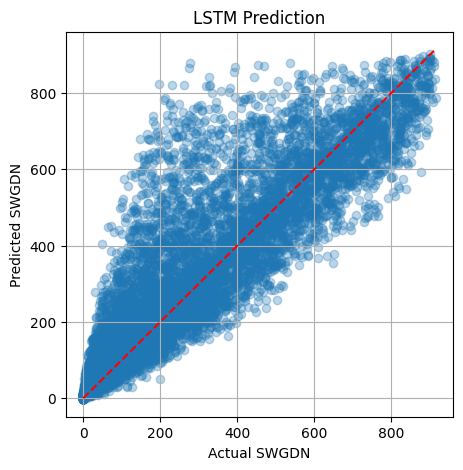

In [ ]:
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt

def evaluate_model(name, y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"{name}:\n  MAE = {mae:.3f}\n  R²  = {r2:.3f}")

    plt.figure(figsize=(5,5))
    plt.scatter(y_true, y_pred, alpha=0.3)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--')
    plt.xlabel("Actual SWGDN")
    plt.ylabel("Predicted SWGDN")
    plt.title(f"{name} Prediction")
    plt.grid(True)
    plt.show()

evaluate_model("SVR", y_test, y_pred_svr)
evaluate_model("XGBoost", y_test, y_pred_xgb)
evaluate_model("LSTM", y_test, y_pred_lstm)


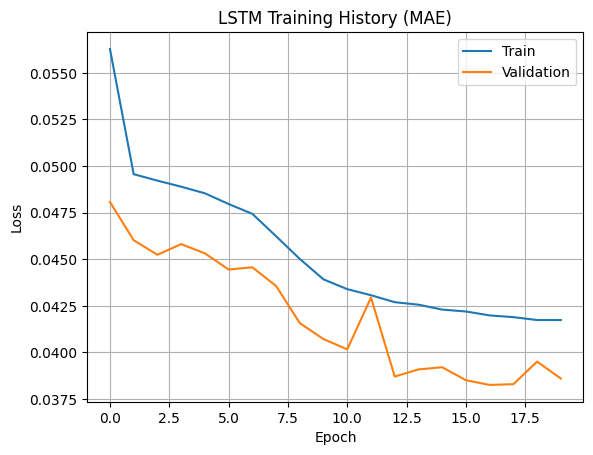

In [ ]:
plt.plot(history_lstm.history['loss'], label='Train')
plt.plot(history_lstm.history['val_loss'], label='Validation')
plt.title("LSTM Training History (MAE)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd

models = ['SVR', 'XGBoost', 'LSTM']
maes = [
    mean_absolute_error(y_test, y_pred_svr),
    mean_absolute_error(y_test, y_pred_xgb),
    mean_absolute_error(y_test, y_pred_lstm)
]
r2s = [
    r2_score(y_test, y_pred_svr),
    r2_score(y_test, y_pred_xgb),
    r2_score(y_test, y_pred_lstm)
]

results_df = pd.DataFrame({
    'Model': models,
    'MAE': maes,
    'R2 Score': r2s
})

print(results_df)


     Model        MAE  R2 Score
0      SVR  62.089570  0.850754
1  XGBoost  40.354233  0.865465
2     LSTM  39.950595  0.858070


## fine tune models

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import os

def tune_xgboost(X_train_scaled, y_train_scaled,
                 param_grid,
                 model_path="best_xgb_model.pkl",
                 cv_results_path="xgb_cv_results.xlsx",
                 plot=True,
                 return_results=False):
    """
    Tune an XGBoost model using GridSearchCV with neg_mean_squared_error,
    save the best model and CV results to Excel, and optionally plot and return results.

    Parameters:
        X_train_scaled (np.ndarray): Scaled training inputs.
        y_train_scaled (np.ndarray): Scaled training targets.
        param_grid (dict): Grid of hyperparameters to search.
        model_path (str): Path to save the best model.
        cv_results_path (str): Path to save CV results as an Excel file.
        plot (bool): Whether to plot results.
        return_results (bool): Whether to return the CV results DataFrame.

    Returns:
        Optional[pd.DataFrame]: DataFrame with grid search results (if return_results=True)
    """

    xgb = XGBRegressor(objective="reg:squarederror", verbosity=0)
    tscv = TimeSeriesSplit(n_splits=5)

    grid_xgb = GridSearchCV(
        estimator=xgb,
        param_grid=param_grid,
        scoring="neg_mean_squared_error",
        cv=tscv,
        verbose=3,
        return_train_score=True,
    )

    grid_xgb.fit(X_train_scaled, y_train_scaled)
    best_xgb = grid_xgb.best_estimator_

    # Save model (only if directory is provided)
    model_dir = os.path.dirname(model_path)
    if model_dir:
        os.makedirs(model_dir, exist_ok=True)
    joblib.dump(best_xgb, model_path)

    print("✅ Best Parameters:", grid_xgb.best_params_)
    print("✅ Best CV MSE:", -grid_xgb.best_score_)

    # Format CV results
    cv_df = pd.DataFrame(grid_xgb.cv_results_)
    cv_df["mean_test_mse"] = -cv_df["mean_test_score"]
    cv_df["params_str"] = cv_df["params"].apply(
        lambda d: ', '.join([f"{k}={v}" for k, v in d.items()])
    )
    cv_df = cv_df.sort_values("mean_test_mse")

    # Save to Excel
    cv_dir = os.path.dirname(cv_results_path)
    if cv_dir:
        os.makedirs(cv_dir, exist_ok=True)
    cv_df.to_excel(cv_results_path, index=False)
    print(f"📊 CV results saved to: {cv_results_path}")

    # Plot if applicable
    if plot and "n_estimators" in param_grid:
        plt.figure(figsize=(12, 6))
        grouped = cv_df.groupby(
            cv_df['params'].apply(lambda d: (d.get('max_depth'), d.get('learning_rate')))
        )
        for (depth, lr), group in grouped:
            if not group.empty:
                x = [d["n_estimators"] for d in group["params"]]
                y = group["mean_test_mse"]
                label = f"depth={depth}, lr={lr}"
                plt.plot(x, y, marker="o", label=label)

        plt.xlabel("n_estimators")
        plt.ylabel("Mean CV MSE")
        plt.title("XGBoost Hyperparameter Tuning")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    if return_results:
        return cv_df


Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5] END learning_rate=0.01, max_depth=6, n_estimators=100;, score=(train=-0.013, test=-0.016) total time=   3.1s
[CV 2/5] END learning_rate=0.01, max_depth=6, n_estimators=100;, score=(train=-0.014, test=-0.013) total time=   4.3s
[CV 3/5] END learning_rate=0.01, max_depth=6, n_estimators=100;, score=(train=-0.014, test=-0.014) total time=   2.8s
[CV 4/5] END learning_rate=0.01, max_depth=6, n_estimators=100;, score=(train=-0.014, test=-0.017) total time=   3.2s
[CV 5/5] END learning_rate=0.01, max_depth=6, n_estimators=100;, score=(train=-0.014, test=-0.012) total time=   5.4s
[CV 1/5] END learning_rate=0.01, max_depth=6, n_estimators=200;, score=(train=-0.006, test=-0.009) total time=   4.0s
[CV 2/5] END learning_rate=0.01, max_depth=6, n_estimators=200;, score=(train=-0.007, test=-0.007) total time=   4.7s
[CV 3/5] END learning_rate=0.01, max_depth=6, n_estimators=200;, score=(train=-0.007, test=-0.008) total time=   

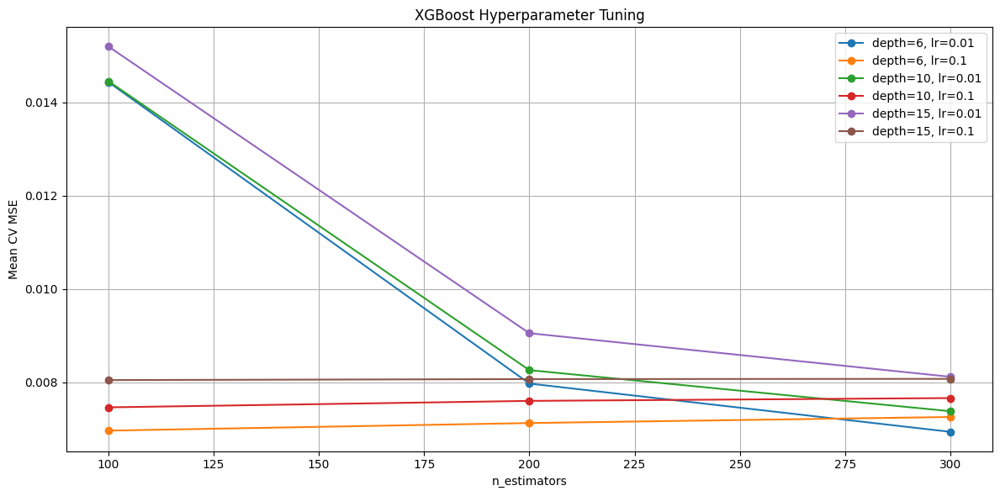

In [ ]:
xgb_params = {
    "n_estimators": [100, 200, 300],
    "learning_rate": [0.01, 0.1],
    "max_depth": [6, 10, 15],
}

cv_results_xgb = tune_xgboost(
    X_train_scaled,
    y_train_scaled,
    param_grid=xgb_params,
    model_path="best_xgb_model.pkl",  # or "models/best_xgb_model.pkl"
    cv_results_path="xgb_cv_results.xlsx",  # or "results/xgb_cv_results.xlsx"
    plot=True,
    return_results=True
)


In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import os

def tune_svr(X_train_scaled, y_train_scaled,
             param_grid,
             model_path="best_svr_model.pkl",
             cv_results_path="svr_cv_results.xlsx",
             plot=True,
             return_results=False):
    """
    Tune an SVR model using GridSearchCV with neg_mean_squared_error,
    save the best model and CV results to Excel, and optionally plot and return results.

    Parameters:
        X_train_scaled (np.ndarray): Scaled training inputs.
        y_train_scaled (np.ndarray): Scaled training targets.
        param_grid (dict): Grid of hyperparameters to search.
        model_path (str): Path to save the best model.
        cv_results_path (str): Path to save CV results as an Excel file.
        plot (bool): Whether to plot results.
        return_results (bool): Whether to return the CV results DataFrame.

    Returns:
        Optional[pd.DataFrame]: DataFrame with grid search results (if return_results=True)
    """

    svr = SVR()
    tscv = TimeSeriesSplit(n_splits=5)

    grid_svr = GridSearchCV(
        estimator=svr,
        param_grid=param_grid,
        scoring="neg_mean_squared_error",
        cv=tscv,
        verbose=3,
        return_train_score=True,
    )

    grid_svr.fit(X_train_scaled, y_train_scaled)
    best_svr = grid_svr.best_estimator_

    # Save model
    model_dir = os.path.dirname(model_path)
    if model_dir:
        os.makedirs(model_dir, exist_ok=True)
    joblib.dump(best_svr, model_path)

    print("✅ Best Parameters:", grid_svr.best_params_)
    print("✅ Best CV MSE:", -grid_svr.best_score_)

    # Format CV results
    cv_df = pd.DataFrame(grid_svr.cv_results_)
    cv_df["mean_test_mse"] = -cv_df["mean_test_score"]
    cv_df["params_str"] = cv_df["params"].apply(
        lambda d: ', '.join([f"{k}={v}" for k, v in d.items()])
    )
    cv_df = cv_df.sort_values("mean_test_mse")

    # Save to Excel
    cv_dir = os.path.dirname(cv_results_path)
    if cv_dir:
        os.makedirs(cv_dir, exist_ok=True)
    cv_df.to_excel(cv_results_path, index=False)
    print(f"📊 CV results saved to: {cv_results_path}")

    # Optional plot
    if plot and "C" in param_grid:
        plt.figure(figsize=(10, 5))
        grouped = cv_df.groupby(
            cv_df["params"].apply(lambda d: d.get("kernel", "rbf"))
        )
        for kernel, group in grouped:
            x = [d["C"] for d in group["params"]]
            y = group["mean_test_mse"]
            plt.plot(x, y, marker='o', label=f"kernel={kernel}")

        plt.xlabel("C")
        plt.ylabel("Mean CV MSE")
        plt.title("SVR Hyperparameter Tuning")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    if return_results:
        return cv_df


Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END C=0.1, gamma=scale, kernel=rbf;, score=(train=-0.010, test=-0.011) total time=   3.7s
[CV 2/5] END C=0.1, gamma=scale, kernel=rbf;, score=(train=-0.010, test=-0.009) total time=  10.2s
[CV 3/5] END C=0.1, gamma=scale, kernel=rbf;, score=(train=-0.010, test=-0.010) total time=  21.3s
[CV 4/5] END C=0.1, gamma=scale, kernel=rbf;, score=(train=-0.010, test=-0.010) total time=  33.2s
[CV 5/5] END C=0.1, gamma=scale, kernel=rbf;, score=(train=-0.010, test=-0.008) total time=  50.6s
[CV 1/5] END C=1, gamma=scale, kernel=rbf;, score=(train=-0.009, test=-0.011) total time=   3.1s
[CV 2/5] END C=1, gamma=scale, kernel=rbf;, score=(train=-0.009, test=-0.008) total time=  10.8s
[CV 3/5] END C=1, gamma=scale, kernel=rbf;, score=(train=-0.008, test=-0.009) total time=  22.4s
[CV 4/5] END C=1, gamma=scale, kernel=rbf;, score=(train=-0.008, test=-0.009) total time=  39.5s
[CV 5/5] END C=1, gamma=scale, kernel=rbf;, score=(train=

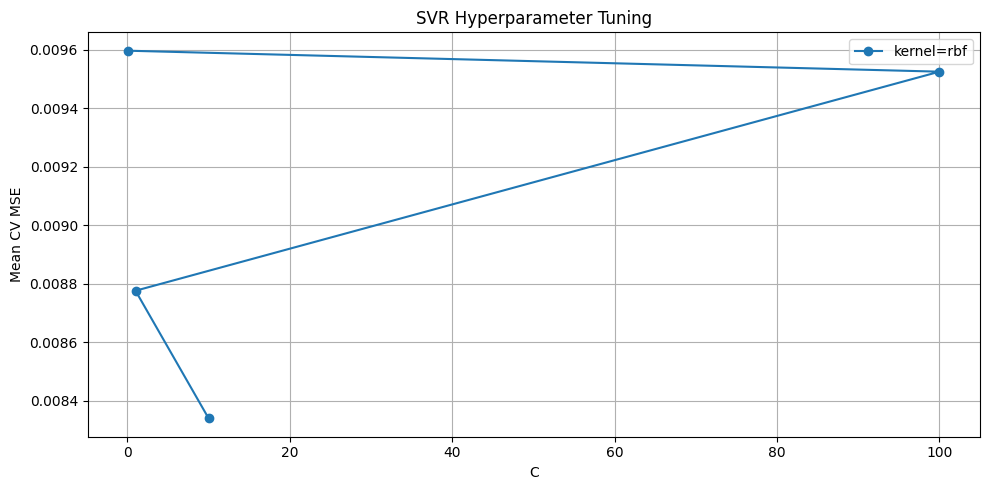

In [ ]:
svr_params = {
    "C": [0.1, 1, 10, 100],
    "gamma": ["scale"],
    "kernel": ["rbf"]
}

cv_results_svr = tune_svr(
    X_train_scaled,
    y_train_scaled,
    param_grid=svr_params,
    model_path="best_svr_model.pkl",
    cv_results_path="svr_cv_results.xlsx",
    plot=True,
    return_results=True
)


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import product
from sklearn.model_selection import TimeSeriesSplit
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping

def build_lstm_model(input_shape, units=50, optimizer='adam'):
    model = Sequential()
    model.add(LSTM(units=units, input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer=optimizer, loss='mse')
    return model

def tune_lstm_manual(X_train_scaled, y_train_scaled,
                     param_grid,
                     model_path="best_lstm_model.keras",
                     cv_results_path="lstm_cv_results.xlsx",
                     plot=True,
                     return_results=False,
                     epochs=10,
                     batch_size=32,
                     patience=3,
                     verbose=0):
    """
    Manually tune LSTM model without scikeras using TimeSeriesSplit.
    """
    input_shape = (X_train_scaled.shape[1], X_train_scaled.shape[2])
    tscv = TimeSeriesSplit(n_splits=3)

    # Prepare grid
    param_keys = list(param_grid.keys())
    param_combinations = list(product(*param_grid.values()))

    results = []

    best_mse = float('inf')
    best_model = None
    best_params = None

    for values in param_combinations:
        param_set = dict(zip(param_keys, values))
        val_mse_scores = []

        for train_idx, val_idx in tscv.split(X_train_scaled):
            X_tr, X_val = X_train_scaled[train_idx], X_train_scaled[val_idx]
            y_tr, y_val = y_train_scaled[train_idx], y_train_scaled[val_idx]

            model = build_lstm_model(input_shape, units=param_set['units'], optimizer=param_set['optimizer'])

            es = EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True, verbose=0)
            model.fit(X_tr, y_tr,
                      validation_data=(X_val, y_val),
                      epochs=epochs,
                      batch_size=batch_size,
                      verbose=verbose,
                      callbacks=[es])

            val_loss = model.evaluate(X_val, y_val, verbose=0)
            val_mse_scores.append(val_loss)

        avg_mse = np.mean(val_mse_scores)
        results.append({**param_set, 'mean_val_mse': avg_mse})

        if avg_mse < best_mse:
            best_mse = avg_mse
            best_model = model
            best_params = param_set

        print(f"Tested {param_set} → Mean Val MSE: {avg_mse:.5f}")

    # Save best model
    if best_model:
        model_dir = os.path.dirname(model_path)
        if model_dir:
            os.makedirs(model_dir, exist_ok=True)
        best_model.save(model_path)
        print(f"✅ Best model saved to: {model_path}")
        print(f"🏆 Best Parameters: {best_params}, MSE: {best_mse:.5f}")

    # Save results
    results_df = pd.DataFrame(results)
    if cv_results_path:
        cv_dir = os.path.dirname(cv_results_path)
        if cv_dir:
            os.makedirs(cv_dir, exist_ok=True)
        results_df.to_excel(cv_results_path, index=False)
        print(f"📊 CV results saved to: {cv_results_path}")

    # Plot
    if plot and "units" in param_grid:
        plt.figure(figsize=(10, 5))
        for opt in param_grid.get("optimizer", ['adam']):
            group = results_df[results_df["optimizer"] == opt]
            plt.plot(group["units"], group["mean_val_mse"], marker="o", label=f"optimizer={opt}")
        plt.xlabel("LSTM Units")
        plt.ylabel("Mean Validation MSE")
        plt.title("Manual LSTM Hyperparameter Tuning")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    if return_results:
        return results_df


Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/10
Epoch 3/10
Epoch 4/10
Epoch 5/10
Epoch 6/10
Epoch 7/10
Epoch 8/10
Epoch 9/10
Epoch 10/10
Epoch 1/10
Epoch 2/10
Epoch 3/10
Epoch 4/10
Epoch 5/10
Epoch 6/10
Epoch 7/10
Epoch 8/10
Epoch 9/10
Epoch 10/10
Epoch 1/10
Epoch 2/10
Epoch 3/10
Epoch 4/10
Epoch 5/10
Epoch 6/10
Epoch 7/10
Epoch 8/10
Epoch 9/10
Epoch 10/10
Tested {'units': 32, 'optimizer': 'adam'} → Mean Val MSE: 0.00706
Epoch 1/10
Epoch 2/10
Epoch 3/10
Epoch 4/10
Epoch 5/10
Epoch 6/10
Epoch 7/10
Epoch 8/10
Epoch 1/10
Epoch 2/10
Epoch 3/10
Epoch 4/10
Epoch 5/10
Epoch 6/10
Epoch 7/10
Epoch 8/10
Epoch 9/10
Epoch 10/10
Epoch 1/10
Epoch 2/10
Epoch 3/10
Epoch 4/10
Epoch 5/10
Epoch 6/10
Epoch 7/10
Epoch 8/10
Epoch 9/10
Epoch 10/10
Tested {'units': 64, 'optimizer': 'adam'} → Mean Val MSE: 0.00722
✅ Best model saved to: best_lstm_model.keras
🏆 Best Parameters: {'units': 32, 'optimizer': 'adam'}, MSE: 0.00706
📊 CV results saved to: results/lstm_cv_results.xlsx


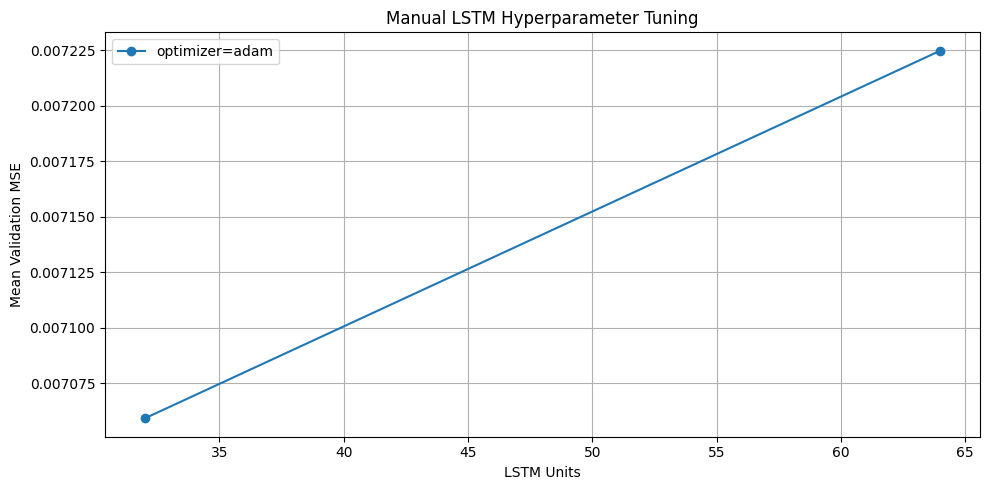

In [ ]:
X_train_lstm = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))

lstm_params = {
    'units': [32, 64],
    'optimizer': ['adam']
}

results_df = tune_lstm_manual(
    X_train_scaled=X_train_lstm,
    y_train_scaled=y_train_scaled,
    param_grid=lstm_params,
    model_path="best_lstm_model.keras",
    cv_results_path="results/lstm_cv_results.xlsx",
    plot=True,
    return_results=True,
    epochs=10,
    batch_size=32,
    verbose=3
)


In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def evaluate_model_on_test_set(model, X_test, y_test, scaler_y=None, model_type='sklearn', plot=True, return_output=False):
    """
    Evaluate a trained model on test data and optionally plot predictions.

    Parameters:
        model: Trained model (e.g., sklearn, XGBoost, or Keras model).
        X_test (np.ndarray): Test input features.
        y_test (np.ndarray): True target values.
        scaler_y (sklearn scaler, optional): Scaler used to inverse transform target values.
        model_type (str): 'sklearn' or 'keras'. Affects prediction method.
        plot (bool): Whether to plot actual vs predicted.
        return_output (bool): Whether to return y_true, y_pred, and metrics.

    Returns:
        Optional: y_true, y_pred, metrics_dict if return_output=True
    """

    # Predict
    if model_type == 'keras':
        y_pred = model.predict(X_test).flatten()
    else:
        y_pred = model.predict(X_test)

    # Inverse transform if scaler is provided
    if scaler_y:
        y_pred = scaler_y.inverse_transform(y_pred.reshape(-1, 1)).flatten()
        y_true = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()
    else:
        y_true = y_test

    # Metrics
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"📉 Test MSE: {mse:.4f}")
    print(f"📉 Test MAE: {mae:.4f}")
    print(f"📈 Test R² Score: {r2:.4f}")

    # Plot
    if plot:
        plt.figure(figsize=(12, 5))
        plt.plot(y_true, label='Actual')
        plt.plot(y_pred, label='Predicted', alpha=0.75)
        plt.title('Model Prediction vs Actual')
        plt.xlabel('Time Step')
        plt.ylabel('Solar Irradiance')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    if return_output:
        return y_true, y_pred, {"mse": mse, "mae": mae, "r2": r2}


In [ ]:
import pickle

# Load model from file
with open('best_xgb_model.pkl', 'rb') as f:
    best_xgb = pickle.load(f)

# Now you can use the model
# e.g., model.predict(X_test)


📉 Test MSE: 6219.1910
📉 Test MAE: 43.6287
📈 Test R² Score: 0.8740


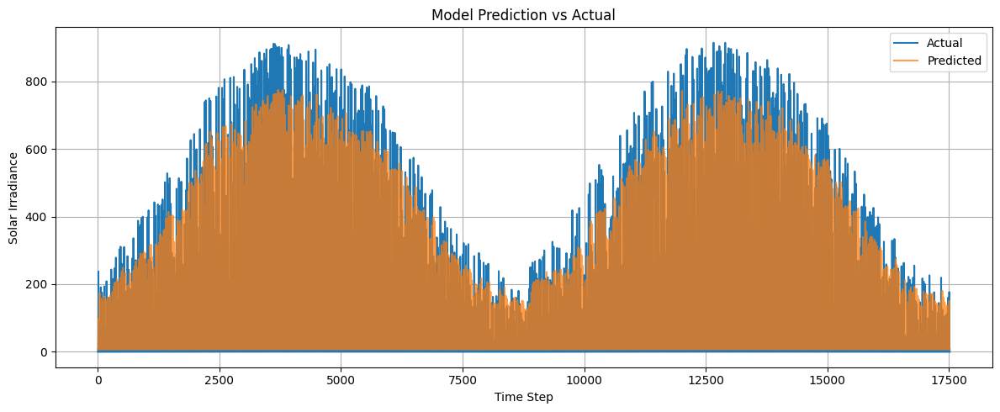

In [ ]:
evaluate_model_on_test_set(best_xgb, X_test_scaled, y_test_scaled, scaler_y=scaler_model, model_type='sklearn')


In [ ]:
import joblib

# Try loading with joblib
best_svr = joblib.load('best_svr_model.pkl')


📉 Test MSE: 7001.1829
📉 Test MAE: 54.2947
📈 Test R² Score: 0.8582


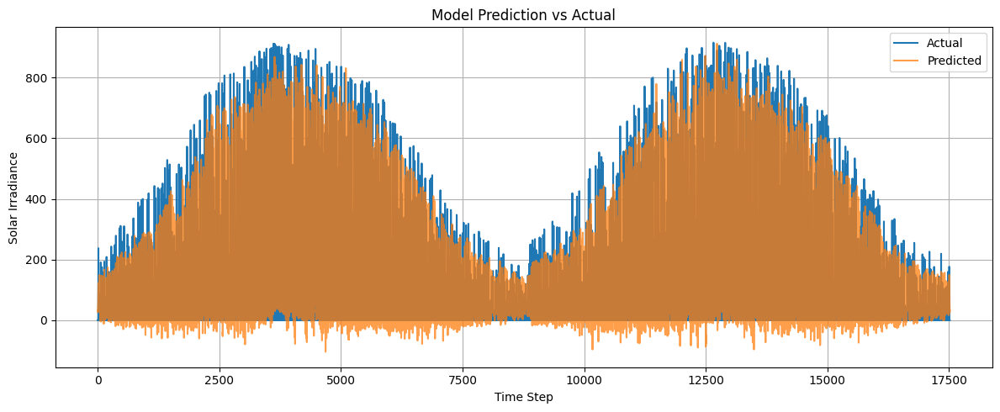

In [ ]:
evaluate_model_on_test_set(best_svr, X_test_scaled, y_test_scaled, scaler_y=scaler_model, model_type='sklearn')


In [ ]:
from tensorflow.keras.models import load_model

# For .keras or .h5 file
best_lstm_model = load_model('best_lstm_model.keras')  # or 'model.h5'

# For a SavedModel folder
# model = load_model('path_to_saved_model_folder/')


548/548 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step
📉 Test MSE: 6592.3919
📉 Test MAE: 42.2574
📈 Test R² Score: 0.8664


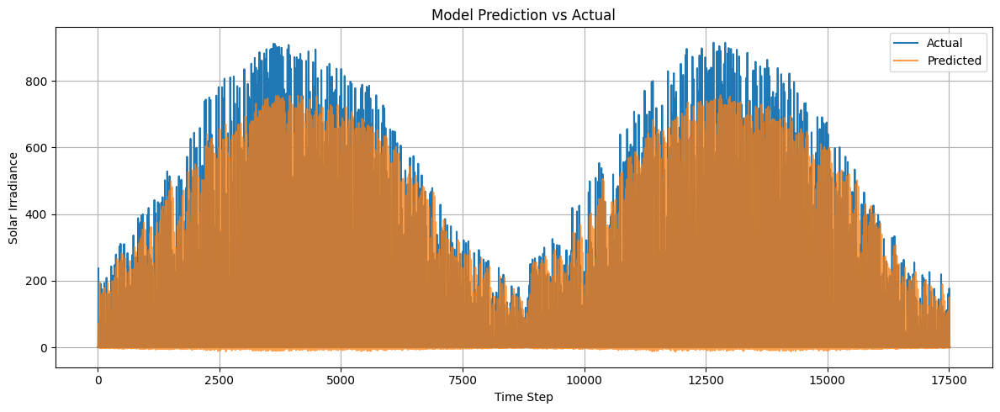

In [ ]:
evaluate_model_on_test_set(best_lstm_model, X_test_scaled, y_test_scaled, scaler_y=scaler_model, model_type='keras')


## Optimize number of features

In [ ]:
df = all_data.copy()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score, mean_absolute_error
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler


In [ ]:
def evaluate_input_hours_range_v2(df, input_range, forecast_horizon=2, best_params=None, train_ratio=0.8):
    results = {'input_hours': [], 'mean_r2': [], 'mean_mae': []}

    print(f"Starting input_hours optimization over range: {list(input_range)}\n")

    for input_hours in input_range:
        print(f"Evaluating input_hours = {input_hours}...")

        # Prepare and split data
        X, y, scaler = prepare_timeseries_data(df, input_hours, forecast_horizon)
        X_train, X_test, y_train, y_test = split_data(X, y, train_ratio=train_ratio)
        print(f"  -> Data prepared. Train size: {len(X_train)}, Test size: {len(X_test)}")

        # Cross-validation
        tscv = TimeSeriesSplit(n_splits=5)
        r2_scores = []
        mae_scores = []

        fold = 1
        for train_idx, val_idx in tscv.split(X_train):
            X_tr, X_val = X_train[train_idx], X_train[val_idx]
            y_tr, y_val = y_train[train_idx], y_train[val_idx]

            model = XGBRegressor(**best_params)
            model.fit(X_tr, y_tr)

            y_pred = model.predict(X_val)
            r2 = r2_score(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)
            r2_scores.append(r2)
            mae_scores.append(mae)

            print(f"    Fold {fold}: R² = {r2:.4f}, MAE = {mae:.4f}")
            fold += 1

        mean_r2 = np.mean(r2_scores)
        mean_mae = np.mean(mae_scores)
        print(f"  -> input_hours {input_hours}: Mean R² = {mean_r2:.4f}, Mean MAE = {mean_mae:.4f}\n")

        results['input_hours'].append(input_hours)
        results['mean_r2'].append(mean_r2)
        results['mean_mae'].append(mean_mae)

    print("Optimization complete.\n")
    return results


In [ ]:
def evaluate_best_model(df, input_hours, forecast_horizon, best_params, train_ratio=0.8):
    print(f"\nTraining final model with input_hours = {input_hours} for test evaluation...")

    # Prepare and split
    X, y, scaler = prepare_timeseries_data(df, input_hours, forecast_horizon)
    X_train, X_test, y_train, y_test = split_data(X, y, train_ratio=train_ratio)
    print(f"  -> Final Train size: {len(X_train)}, Test size: {len(X_test)}")

    # Train final model
    model = XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    print(f"✅ Final Test Evaluation:")
    print(f"   R² Score: {r2:.4f}")
    print(f"   MAE     : {mae:.4f}\n")

    return model, y_test, y_pred


In [ ]:
def plot_results(results):
    plt.figure()
    plt.plot(results['input_hours'], results['mean_r2'], marker='o')
    plt.title("R² Score vs. Input Hours")
    plt.xlabel("Input Hours")
    plt.ylabel("Mean R²")
    plt.grid(True)
    plt.show()

    plt.figure()
    plt.plot(results['input_hours'], results['mean_mae'], marker='o')
    plt.title("MAE vs. Input Hours")
    plt.xlabel("Input Hours")
    plt.ylabel("Mean MAE")
    plt.grid(True)
    plt.show()


Starting input_hours optimization over range: [48, 52, 56, 60, 64, 68, 72, 76, 80, 84, 88, 92]

Evaluating input_hours = 48...
  -> Data prepared. Train size: 70080, Test size: 17521
    Fold 1: R² = 0.8664, MAE = 0.0491
    Fold 2: R² = 0.8747, MAE = 0.0387
    Fold 3: R² = 0.8633, MAE = 0.0423
    Fold 4: R² = 0.8910, MAE = 0.0460
    Fold 5: R² = 0.9052, MAE = 0.0352
  -> input_hours 48: Mean R² = 0.8801, Mean MAE = 0.0423

Evaluating input_hours = 52...
  -> Data prepared. Train size: 70077, Test size: 17520
    Fold 1: R² = 0.8649, MAE = 0.0490
    Fold 2: R² = 0.8749, MAE = 0.0386
    Fold 3: R² = 0.8615, MAE = 0.0426
    Fold 4: R² = 0.8897, MAE = 0.0461
    Fold 5: R² = 0.9050, MAE = 0.0351
  -> input_hours 52: Mean R² = 0.8792, Mean MAE = 0.0423

Evaluating input_hours = 56...
  -> Data prepared. Train size: 70074, Test size: 17519
    Fold 1: R² = 0.8655, MAE = 0.0490
    Fold 2: R² = 0.8745, MAE = 0.0386
    Fold 3: R² = 0.8620, MAE = 0.0425
    Fold 4: R² = 0.8914, MAE = 0.

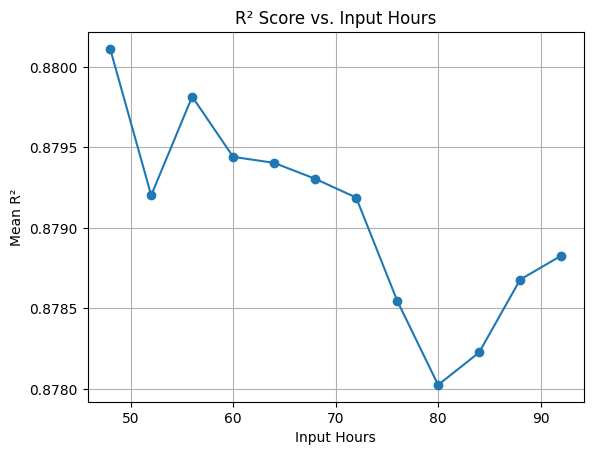

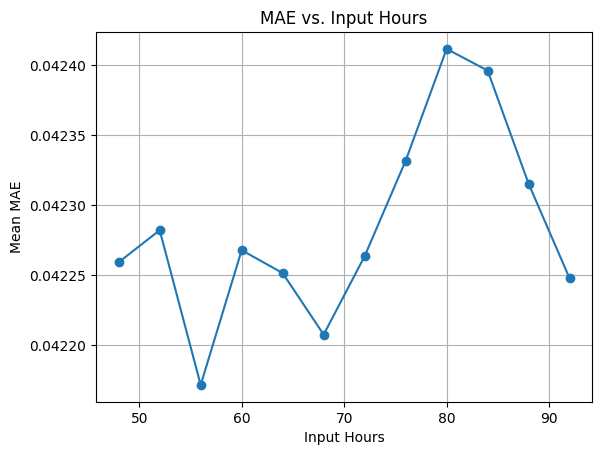

🎯 Best input_hours based on CV R²: 48

Training final model with input_hours = 48 for test evaluation...
  -> Final Train size: 70098, Test size: 17525
✅ Final Test Evaluation:
   R² Score: 0.9605
   MAE     : 0.0224



In [ ]:
input_range = range(48, 96, 4)
best_params = {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100}

# Step 1: Run optimization
results = evaluate_input_hours_range_v2(df, input_range, forecast_horizon=24, best_params=best_params)

# Step 2: Plot
plot_results(results)

# Step 3: Best input_hours
best_idx = np.argmax(results['mean_r2'])
best_input_hours = results['input_hours'][best_idx]
print(f"🎯 Best input_hours based on CV R²: {best_input_hours}")

# Step 4: Final test evaluation
final_model, y_test, y_pred = evaluate_best_model(df, best_input_hours, forecast_horizon=2, best_params=best_params)


## hyper parameter tuning with optimizing number of features

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import r2_score, mean_absolute_error
from xgboost import XGBRegressor
import os
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error
import pandas as pd
import joblib

In [ ]:
def tune_xgboost(X, y, param_grid, model_path=None, cv_results_path=None, plot=False, return_results=False):


    xgb = XGBRegressor()
    scorer = make_scorer(mean_squared_error, greater_is_better=False)

    grid = GridSearchCV(xgb, param_grid, scoring=scorer, cv=5, verbose=3, n_jobs=-1, return_train_score=True)
    grid.fit(X, y)

    best_model = grid.best_estimator_

    print(f"✅ Best Parameters: {grid.best_params_}")
    print(f"✅ Best CV MSE: {-grid.best_score_}")

    if model_path:
        joblib.dump(best_model, model_path)

    if cv_results_path:
        df_results = pd.DataFrame(grid.cv_results_)
        df_results.to_excel(cv_results_path, index=False)
        print(f"📊 CV results saved to: {cv_results_path}")
    else:
        df_results = pd.DataFrame(grid.cv_results_)

    if plot:
        import matplotlib.pyplot as plt
        import seaborn as sns

        sns.boxplot(data=df_results, x='param_max_depth', y='mean_test_score')
        plt.title("CV Score by max_depth")
        plt.show()

    if return_results:
        return best_model, df_results
    else:
        return best_model


In [ ]:


def evaluate_input_hours_with_tuning(
    df,
    input_hours_range,
    forecast_horizon,
    xgb_param_grid,
    train_ratio=0.8,
    results_excel_path="input_hours_xgb_results.xlsx"
):
    all_results = []

    for input_hours in input_hours_range:
        print(f"\n🔄 Processing input_hours = {input_hours}")

        # Step 1: Prepare and split data
        X_seq, y_seq, scaler_model = prepare_timeseries_data(df, input_hours, forecast_horizon)
        X_train, X_test, y_train, y_test = split_data(X_seq, y_seq, train_ratio=train_ratio)

        print(f"   ➤ Train shape: {X_train.shape}, {y_train.shape}")
        print(f"   ➤ Test shape:  {X_test.shape}, {y_test.shape}")

        # Step 2: Tune model
        model_path = f"xgb_model_input_{input_hours}.pkl"
        cv_results_path = f"xgb_cv_results_input_{input_hours}.xlsx"

        best_model, cv_df = tune_xgboost(
            X_train,
            y_train,
            param_grid=xgb_param_grid,
            model_path=model_path,
            cv_results_path=cv_results_path,
            plot=False,
            return_results=True
        )

        # Step 3: Evaluate on test set
        y_pred = best_model.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)

        print(f"   ✅ Test R²: {r2:.4f}, MAE: {mae:.4f}")

        # Step 4: Save result row
        best_params = best_model.get_params()
        result = {
            "input_hours": input_hours,
            "test_r2": r2,
            "test_mae": mae,
            "best_n_estimators": best_params['n_estimators'],
            "best_learning_rate": best_params['learning_rate'],
            "best_max_depth": best_params['max_depth']
        }
        all_results.append(result)

    # Step 5: Save all results to Excel
    final_df = pd.DataFrame(all_results)
    final_df.to_excel(results_excel_path, index=False)
    print(f"\n📁 All results saved to {results_excel_path}")

    return final_df


In [ ]:
xgb_params = {
    "n_estimators": [200, 300, 350],
    "learning_rate": [0.01, 0.1],
    "max_depth": [6, 10, 14],
}

input_hours_range = range(48, 72, 4)

df_results = evaluate_input_hours_with_tuning(
    df=df,
    input_hours_range=input_hours_range,
    forecast_horizon=2,
    xgb_param_grid=xgb_params,
    results_excel_path="input_hours_xgb_summary.xlsx"
)



🔄 Processing input_hours = 48
   ➤ Train shape: (70098, 48), (70098,)
   ➤ Test shape:  (17525, 48), (17525,)
Fitting 5 folds for each of 18 candidates, totalling 90 fits
✅ Best Parameters: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 200}
✅ Best CV MSE: 0.00213212465209679
📊 CV results saved to: xgb_cv_results_input_48.xlsx
   ✅ Test R²: 0.9610, MAE: 0.0221

🔄 Processing input_hours = 52
   ➤ Train shape: (70095, 52), (70095,)
   ➤ Test shape:  (17524, 52), (17524,)
Fitting 5 folds for each of 18 candidates, totalling 90 fits
✅ Best Parameters: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 200}
✅ Best CV MSE: 0.0021293364054953837
📊 CV results saved to: xgb_cv_results_input_52.xlsx
   ✅ Test R²: 0.9607, MAE: 0.0222

🔄 Processing input_hours = 56
   ➤ Train shape: (70092, 56), (70092,)
   ➤ Test shape:  (17523, 56), (17523,)
Fitting 5 folds for each of 18 candidates, totalling 90 fits
✅ Best Parameters: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 300}
✅ B

### ✅ Best Model Configuration for Time Series Forecasting

- **Optimal Input Hours**: `48`
- **Best XGBoost Parameters**:
  - `n_estimators`: **200**
  - `learning_rate`: **0.1**
  - `max_depth`: **6**


# Using Weather Data

## XGboost

In [12]:
import numpy as np

def encode_time_features(df):
    df = df.copy()

    # Cyclical Encoding
    df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
    df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

    df['day_sin'] = np.sin(2 * np.pi * df['day'] / 31)
    df['day_cos'] = np.cos(2 * np.pi * df['day'] / 31)

    df['quarter_sin'] = np.sin(2 * np.pi * df['quarter'] / 4)
    df['quarter_cos'] = np.cos(2 * np.pi * df['quarter'] / 4)

    # Drop original time-related categorical features
    df.drop(columns=['hour', 'month', 'day', 'quarter', 'month_name', 'year'], errors='ignore', inplace=True)

    return df


In [13]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd

def prepare_multivariate_timeseries_data(
    df, input_hours=24, forecast_horizon=2, target_col="swgdn"
):
    df = df.copy()

    drop_cols = ['swtdn', 'year', 'month_name', 'time', 'local_time']
    df.drop(columns=[col for col in drop_cols if col in df.columns], inplace=True)

    static_features = [col for col in df.columns if col != target_col]
    feature_names = []

    # Separate target and features
    target_vals = df[[target_col]].values
    feature_vals = df[static_features].values

    # Scale separately
    y_scaler = MinMaxScaler()
    X_scaler = MinMaxScaler()

    target_scaled = y_scaler.fit_transform(target_vals).flatten()
    features_scaled = X_scaler.fit_transform(feature_vals)

    X, y = [], []

    for i in range(len(df) - input_hours - forecast_horizon + 1):
        lag_seq = target_scaled[i : i + input_hours]

        future_idx = i + input_hours + forecast_horizon - 1
        static_feat = features_scaled[future_idx]

        X.append(np.concatenate([lag_seq, static_feat]))
        y.append(target_scaled[future_idx])  # predict target value

    feature_names = [f"{target_col}_lag_{i+1}" for i in range(input_hours)] + static_features

    return np.array(X), np.array(y), X_scaler, y_scaler, feature_names



In [14]:
df = all_data.copy()

In [15]:
df_encoded = encode_time_features(df)

X_seq, y_seq, X_scaler, y_scaler, feature_names  = prepare_multivariate_timeseries_data(
    df_encoded, input_hours=48, forecast_horizon=24
)

X_train, X_test, y_train, y_test = split_data(X_seq, y_seq)

print(f"Train shape: {X_train.shape}, {y_train.shape}")
print(f"Test shape: {X_test.shape}, {y_test.shape}")
print(f"Input features: {feature_names}")


Train shape: (70080, 63), (70080,)
Test shape: (17521, 63), (17521,)
Input features: ['swgdn_lag_1', 'swgdn_lag_2', 'swgdn_lag_3', 'swgdn_lag_4', 'swgdn_lag_5', 'swgdn_lag_6', 'swgdn_lag_7', 'swgdn_lag_8', 'swgdn_lag_9', 'swgdn_lag_10', 'swgdn_lag_11', 'swgdn_lag_12', 'swgdn_lag_13', 'swgdn_lag_14', 'swgdn_lag_15', 'swgdn_lag_16', 'swgdn_lag_17', 'swgdn_lag_18', 'swgdn_lag_19', 'swgdn_lag_20', 'swgdn_lag_21', 'swgdn_lag_22', 'swgdn_lag_23', 'swgdn_lag_24', 'swgdn_lag_25', 'swgdn_lag_26', 'swgdn_lag_27', 'swgdn_lag_28', 'swgdn_lag_29', 'swgdn_lag_30', 'swgdn_lag_31', 'swgdn_lag_32', 'swgdn_lag_33', 'swgdn_lag_34', 'swgdn_lag_35', 'swgdn_lag_36', 'swgdn_lag_37', 'swgdn_lag_38', 'swgdn_lag_39', 'swgdn_lag_40', 'swgdn_lag_41', 'swgdn_lag_42', 'swgdn_lag_43', 'swgdn_lag_44', 'swgdn_lag_45', 'swgdn_lag_46', 'swgdn_lag_47', 'swgdn_lag_48', 't2m', 'prectotland', 'precsnoland', 'snomas', 'rhoa', 'cldtot', 'wind_speed', 'hour_sin', 'hour_cos', 'month_sin', 'month_cos', 'day_sin', 'day_cos', 'qua

In [16]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# 3. Train XGBoost model
xgb = XGBRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=6,
    objective='reg:squarederror',
    random_state=42
)

print("🚀 Training XGBoost...")
xgb.fit(X_train, y_train)

# 4. Predict and Evaluate
y_pred = xgb.predict(X_test)

# ✅ Inverse transform predictions and true values using y_scaler
y_test_inv = y_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
y_pred_inv = y_scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()

# Metrics
mae = mean_absolute_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
r2 = r2_score(y_test_inv, y_pred_inv)

input_hours=48
forecast_horizon=24

# 5. Print results
print("\n📊 Evaluation Results (on test set):")
print(f"Input Hours       : {input_hours}")
print(f"Forecast Horizon  : {forecast_horizon}")
print(f"Features Used     : {len(feature_names)} total")

print(f"✅ MAE   : {mae:.4f}")
print(f"✅ RMSE  : {rmse:.4f}")
print(f"✅ R²     : {r2:.4f}")


🚀 Training XGBoost...

📊 Evaluation Results (on test set):
Input Hours       : 48
Forecast Horizon  : 24
Features Used     : 63 total
✅ MAE   : 18.5502
✅ RMSE  : 38.9401
✅ R²     : 0.9693


In [17]:
xgb_params = {
    "n_estimators": [50, 100, 200],
    "learning_rate": [0.01, 0.1],
    "max_depth": [6, 10, 13],
}

cv_results_xgb = tune_xgboost(
    X_train, y_train,
    param_grid=xgb_params,
    model_path="best_xgb_model_with_weather_data.pkl",  # or "models/best_xgb_model.pkl"
    cv_results_path="xgb_cv_results-weather_data.xlsx",  # or "results/xgb_cv_results.xlsx"
    plot=True,
    return_results=True
)


NameError: name 'tune_xgboost' is not defined

In [18]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import os

def tune_xgboost(X_train_scaled, y_train_scaled,
                 param_grid,
                 model_path="best_xgb_model.pkl",
                 cv_results_path="xgb_cv_results.xlsx",
                 plot=True,
                 return_results=False):
    """
    Tune an XGBoost model using GridSearchCV with neg_mean_squared_error,
    save the best model and CV results to Excel, and optionally plot and return results.

    Parameters:
        X_train_scaled (np.ndarray): Scaled training inputs.
        y_train_scaled (np.ndarray): Scaled training targets.
        param_grid (dict): Grid of hyperparameters to search.
        model_path (str): Path to save the best model.
        cv_results_path (str): Path to save CV results as an Excel file.
        plot (bool): Whether to plot results.
        return_results (bool): Whether to return the CV results DataFrame.

    Returns:
        Optional[pd.DataFrame]: DataFrame with grid search results (if return_results=True)
    """

    xgb = XGBRegressor(objective="reg:squarederror", verbosity=0)
    tscv = TimeSeriesSplit(n_splits=5)

    grid_xgb = GridSearchCV(
        estimator=xgb,
        param_grid=param_grid,
        scoring="neg_mean_squared_error",
        cv=tscv,
        verbose=3,
        return_train_score=True,
    )

    grid_xgb.fit(X_train_scaled, y_train_scaled)
    best_xgb = grid_xgb.best_estimator_

    # Save model (only if directory is provided)
    model_dir = os.path.dirname(model_path)
    if model_dir:
        os.makedirs(model_dir, exist_ok=True)
    joblib.dump(best_xgb, model_path)

    print("✅ Best Parameters:", grid_xgb.best_params_)
    print("✅ Best CV MSE:", -grid_xgb.best_score_)

    # Format CV results
    cv_df = pd.DataFrame(grid_xgb.cv_results_)
    cv_df["mean_test_mse"] = -cv_df["mean_test_score"]
    cv_df["params_str"] = cv_df["params"].apply(
        lambda d: ', '.join([f"{k}={v}" for k, v in d.items()])
    )
    cv_df = cv_df.sort_values("mean_test_mse")

    # Save to Excel
    cv_dir = os.path.dirname(cv_results_path)
    if cv_dir:
        os.makedirs(cv_dir, exist_ok=True)
    cv_df.to_excel(cv_results_path, index=False)
    print(f"📊 CV results saved to: {cv_results_path}")

    # Plot if applicable
    if plot and "n_estimators" in param_grid:
        plt.figure(figsize=(12, 6))
        grouped = cv_df.groupby(
            cv_df['params'].apply(lambda d: (d.get('max_depth'), d.get('learning_rate')))
        )
        for (depth, lr), group in grouped:
            if not group.empty:
                x = [d["n_estimators"] for d in group["params"]]
                y = group["mean_test_mse"]
                label = f"depth={depth}, lr={lr}"
                plt.plot(x, y, marker="o", label=label)

        plt.xlabel("n_estimators")
        plt.ylabel("Mean CV MSE")
        plt.title("XGBoost Hyperparameter Tuning")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    if return_results:
        return cv_df


Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5] END learning_rate=0.01, max_depth=6, n_estimators=50;, score=(train=-0.022, test=-0.028) total time=   1.6s
[CV 2/5] END learning_rate=0.01, max_depth=6, n_estimators=50;, score=(train=-0.025, test=-0.021) total time=   1.8s
[CV 3/5] END learning_rate=0.01, max_depth=6, n_estimators=50;, score=(train=-0.023, test=-0.022) total time=   2.0s
[CV 4/5] END learning_rate=0.01, max_depth=6, n_estimators=50;, score=(train=-0.023, test=-0.029) total time=   2.3s
[CV 5/5] END learning_rate=0.01, max_depth=6, n_estimators=50;, score=(train=-0.024, test=-0.022) total time=   5.0s
[CV 1/5] END learning_rate=0.01, max_depth=6, n_estimators=100;, score=(train=-0.010, test=-0.014) total time=   2.8s
[CV 2/5] END learning_rate=0.01, max_depth=6, n_estimators=100;, score=(train=-0.011, test=-0.009) total time=   3.3s
[CV 3/5] END learning_rate=0.01, max_depth=6, n_estimators=100;, score=(train=-0.011, test=-0.010) total time=   5.5s


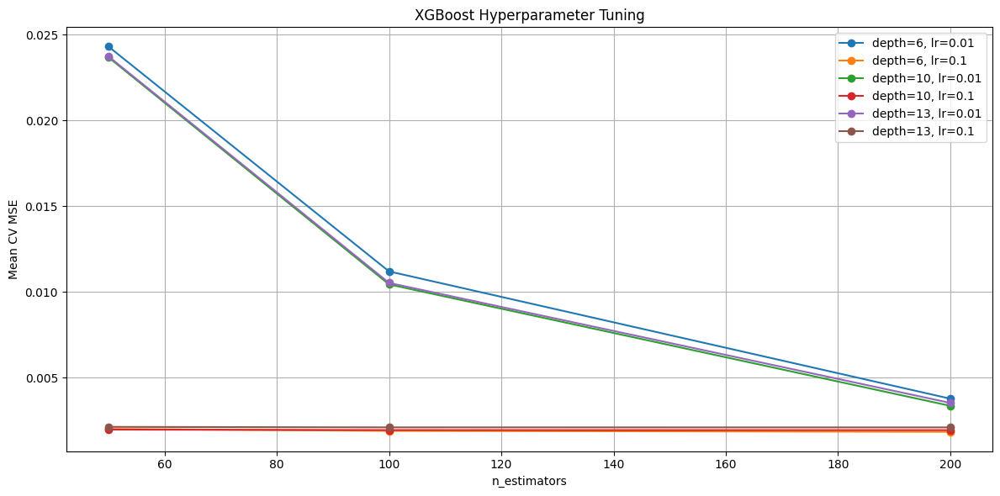

In [19]:
xgb_params = {
    "n_estimators": [50, 100, 200],
    "learning_rate": [0.01, 0.1],
    "max_depth": [6, 10, 13],
}

cv_results_xgb = tune_xgboost(
    X_train, y_train,
    param_grid=xgb_params,
    model_path="best_xgb_model_with_weather_data.pkl",  # or "models/best_xgb_model.pkl"
    cv_results_path="xgb_cv_results-weather_data.xlsx",  # or "results/xgb_cv_results.xlsx"
    plot=True,
    return_results=True
)


📉 Test MSE: 1487.6811
📉 Test MAE: 18.3657
📈 Test R² Score: 0.9699


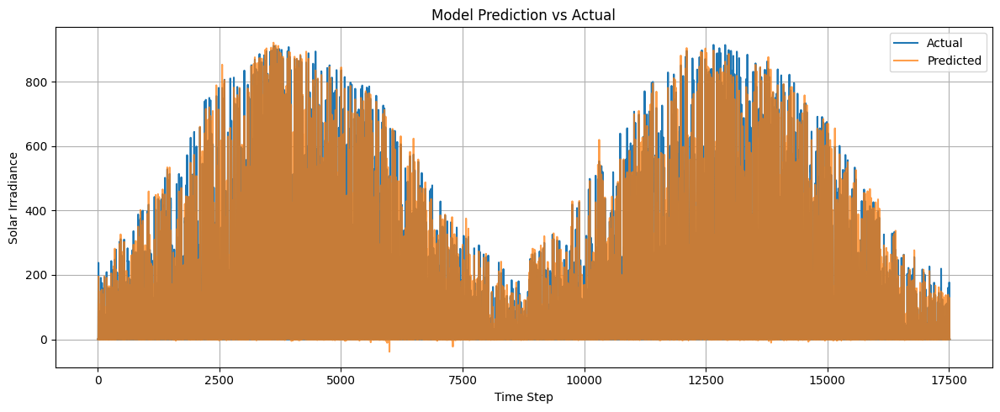

In [22]:
import pickle

# Load model from file
with open('best_xgb_model_with_weather_data.pkl', 'rb') as f:
    best_xgb = pickle.load(f)

# Now you can use the model
# e.g., model.predict(X_test)
evaluate_model_on_test_set(best_xgb, X_test, y_test, scaler_y=y_scaler, model_type='sklearn')


In [23]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_predictions_by_month(df_original, y_test, y_pred, y_scaler, X_train_len, input_hours, forecast_horizon):
    # Inverse transform
    y_test_inv = y_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_pred_inv = y_scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()

    # Calculate start index of the test predictions in original data
    start_index = input_hours + forecast_horizon - 1 + X_train_len
    test_dates = pd.to_datetime(df_original.iloc[start_index : start_index + len(y_test)]['local_time'])

    # Create a DataFrame with predictions and actuals
    df_plot = pd.DataFrame({
        'date': test_dates,
        'actual': y_test_inv,
        'predicted': y_pred_inv
    })

    df_plot['month'] = df_plot['date'].dt.month
    df_plot['month_name'] = df_plot['date'].dt.strftime('%B')
    df_plot['year'] = df_plot['date'].dt.year

    # Plot month by month
    for (year, month), group in df_plot.groupby(['year', 'month']):
        month_label = group['month_name'].iloc[0]
        print(f"📅 Plotting {month_label} {year}...")

        plt.figure(figsize=(14, 6))
        plt.plot(group['date'], group['actual'], label='Actual', marker='o', linewidth=1)
        plt.plot(group['date'], group['predicted'], label='Predicted', marker='x', linewidth=1)
        plt.title(f"🌤️ Actual vs Predicted SWGDN — {month_label} {year}")
        plt.xlabel("Date")
        plt.ylabel("SWGDN")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()


📅 Plotting January 2023...


/tmp/ipython-input-3473602009.py:37: UserWarning: Glyph 127780 (\N{WHITE SUN WITH SMALL CLOUD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127780 (\N{WHITE SUN WITH SMALL CLOUD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


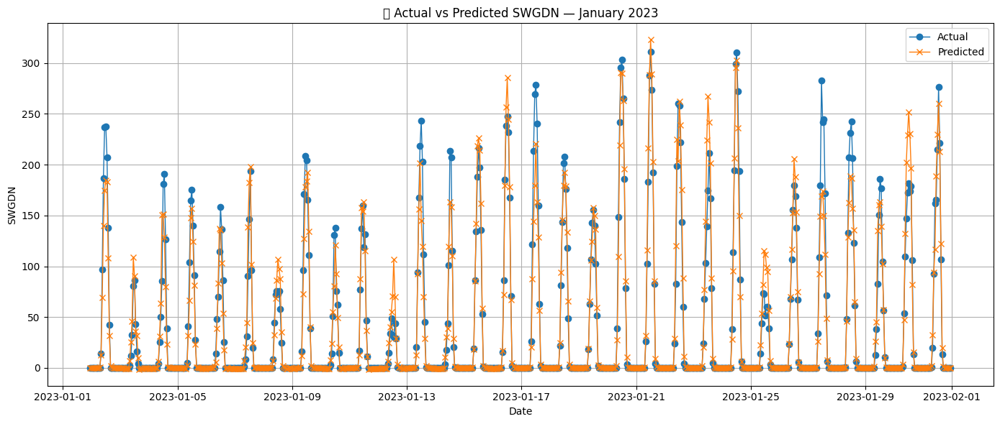

📅 Plotting February 2023...


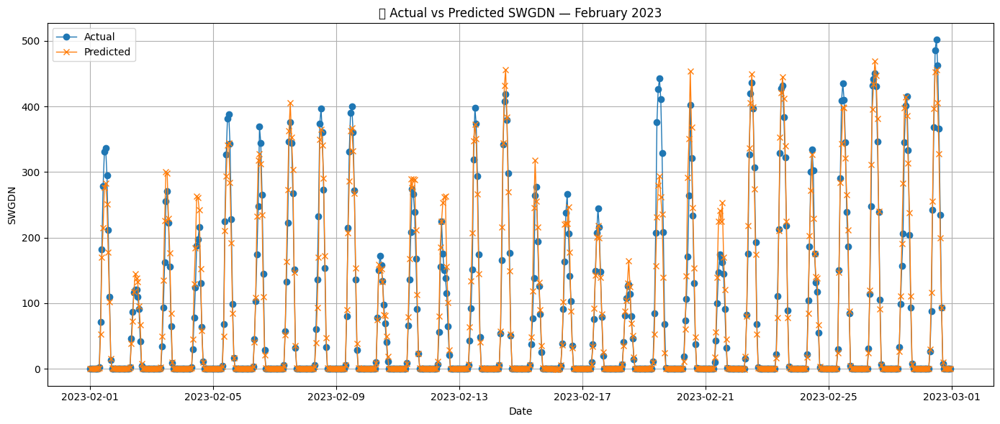

📅 Plotting March 2023...


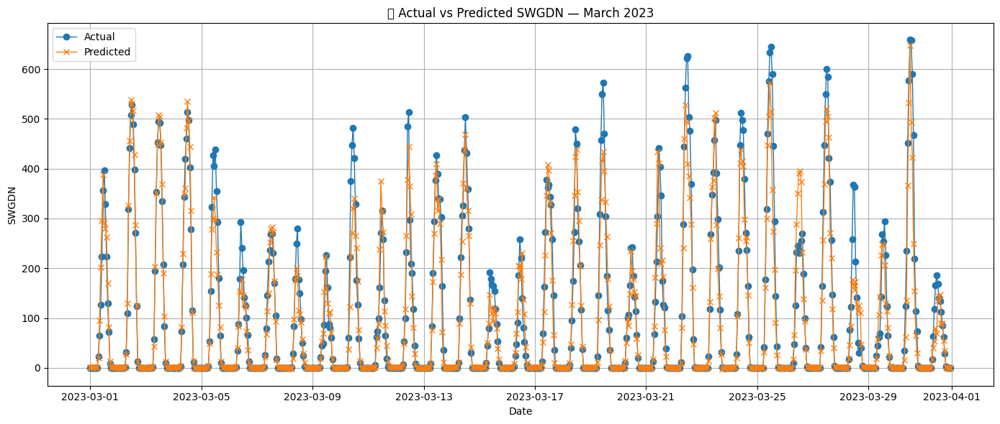

📅 Plotting April 2023...


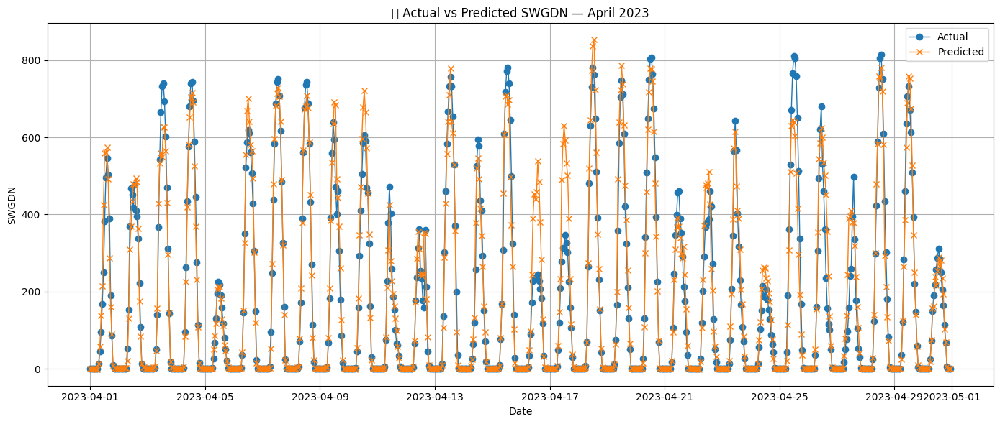

📅 Plotting May 2023...


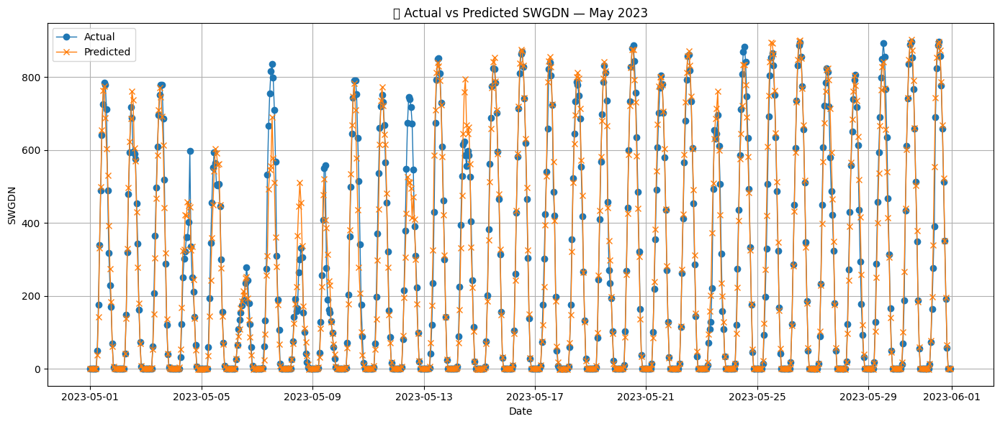

📅 Plotting June 2023...


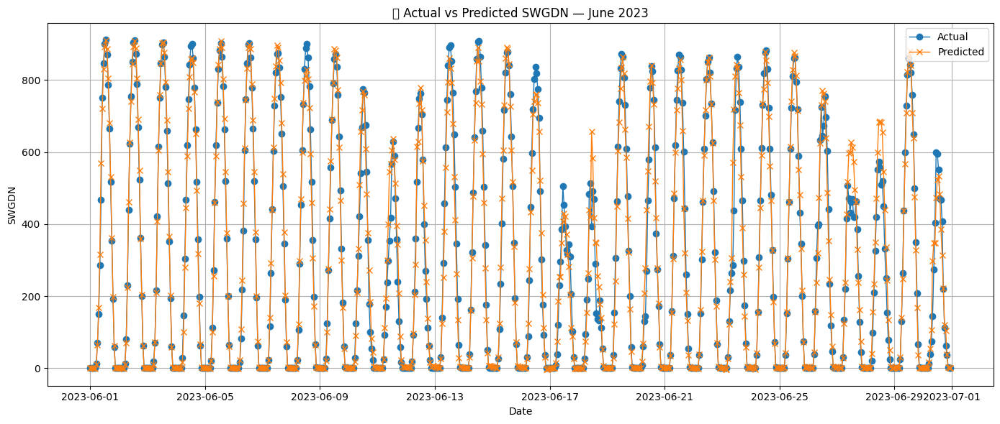

📅 Plotting July 2023...


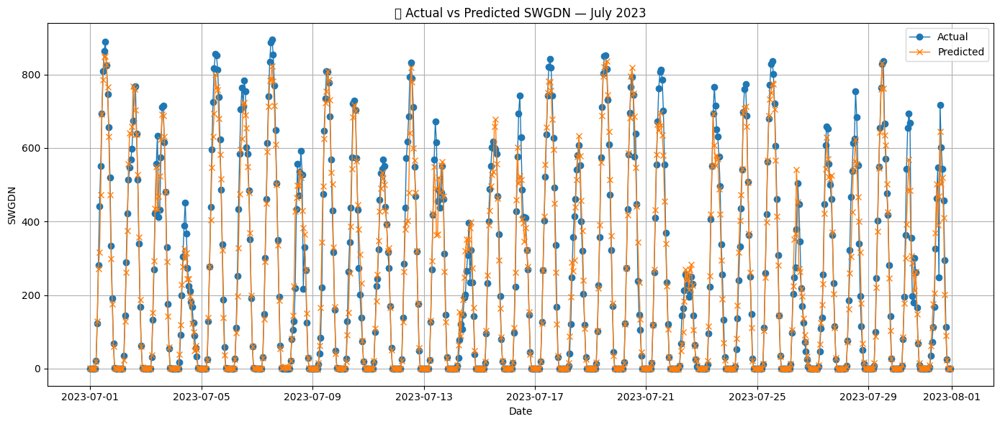

📅 Plotting August 2023...


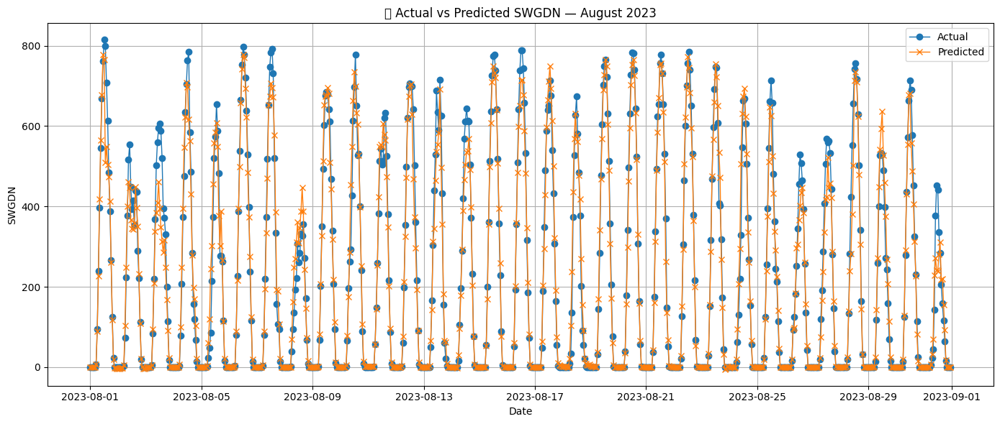

📅 Plotting September 2023...


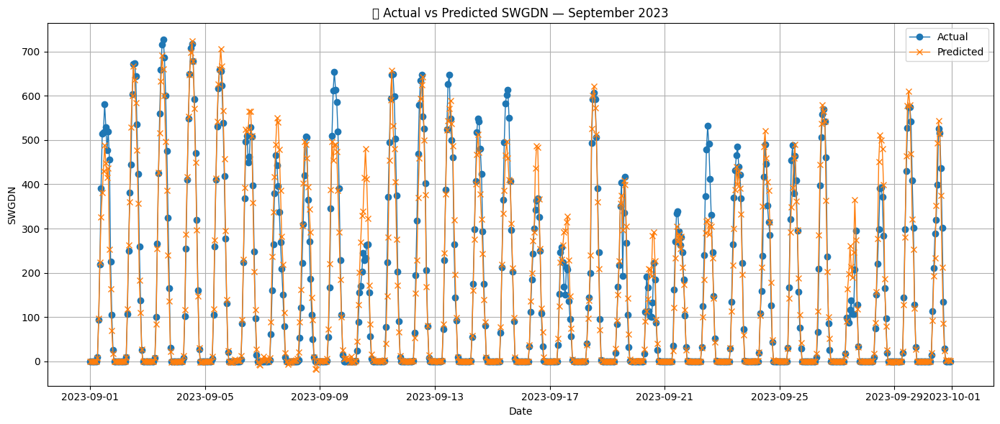

📅 Plotting October 2023...


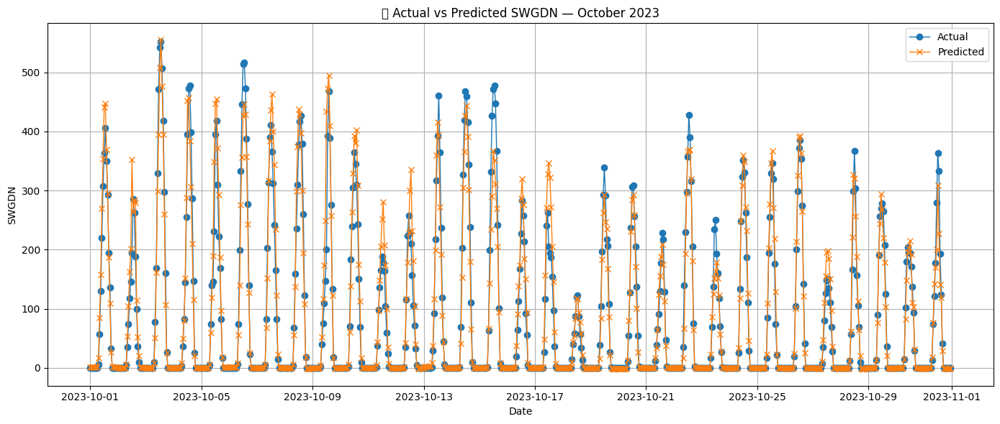

📅 Plotting November 2023...


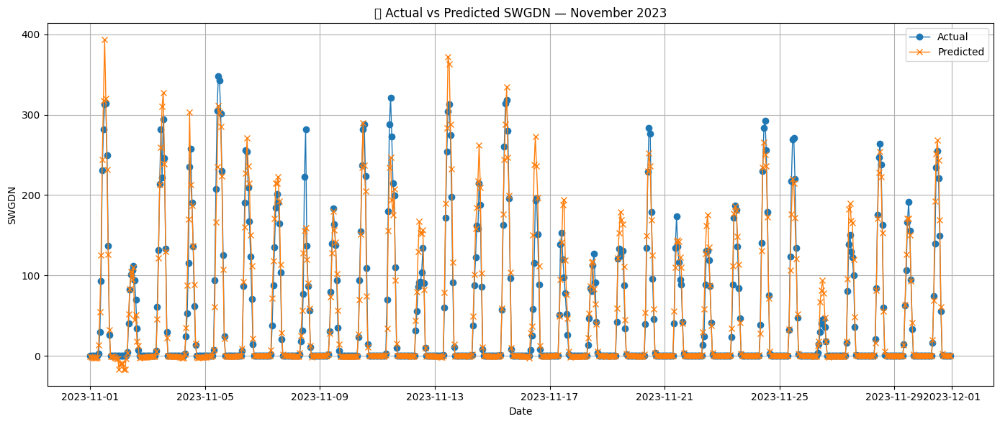

📅 Plotting December 2023...


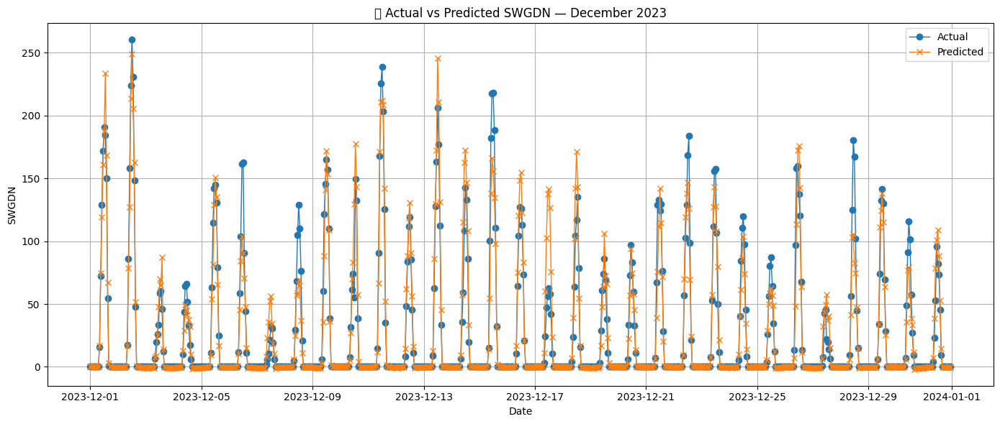

📅 Plotting January 2024...


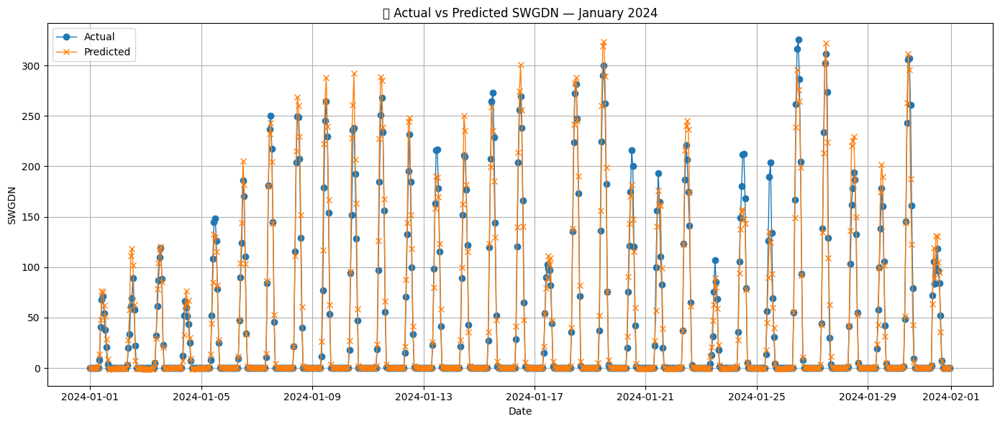

📅 Plotting February 2024...


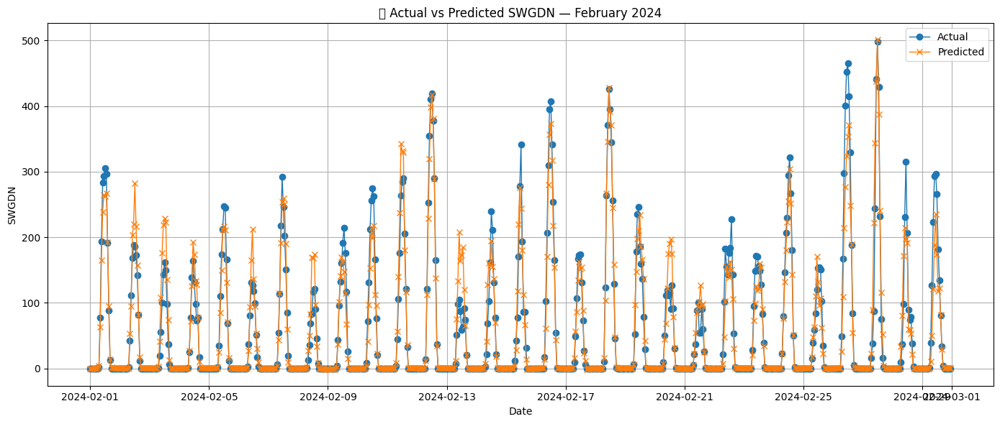

📅 Plotting March 2024...


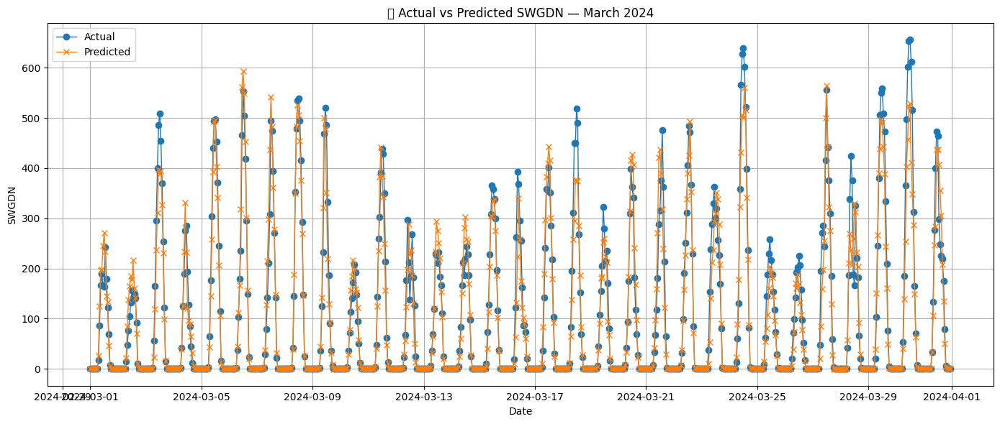

📅 Plotting April 2024...


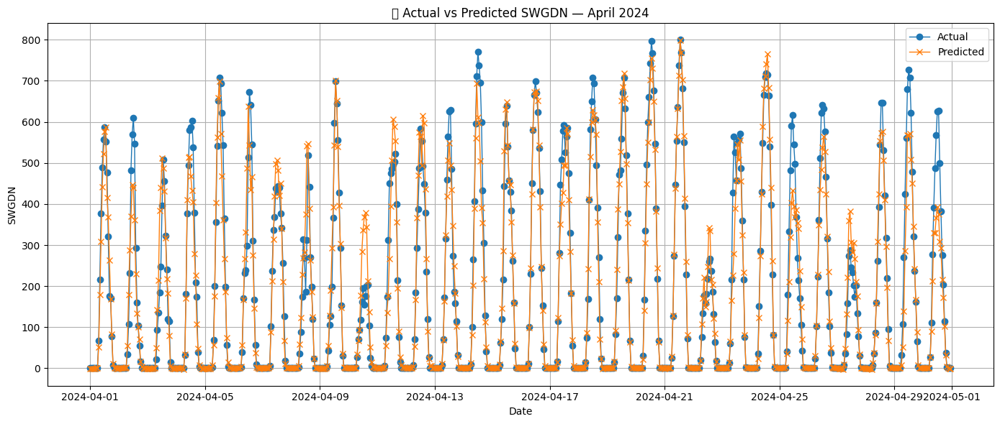

📅 Plotting May 2024...


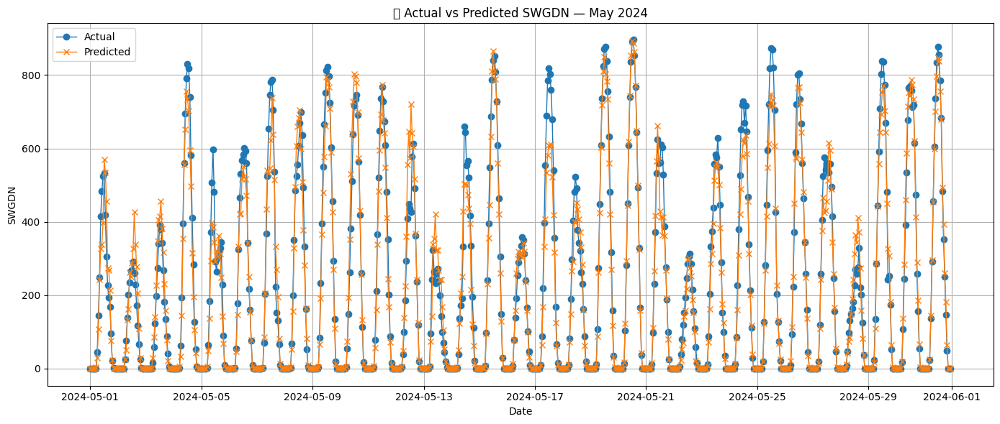

📅 Plotting June 2024...


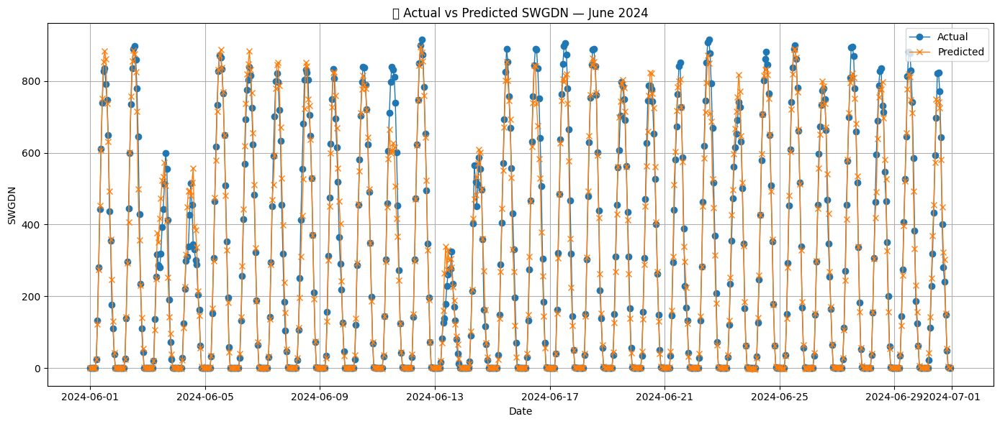

📅 Plotting July 2024...


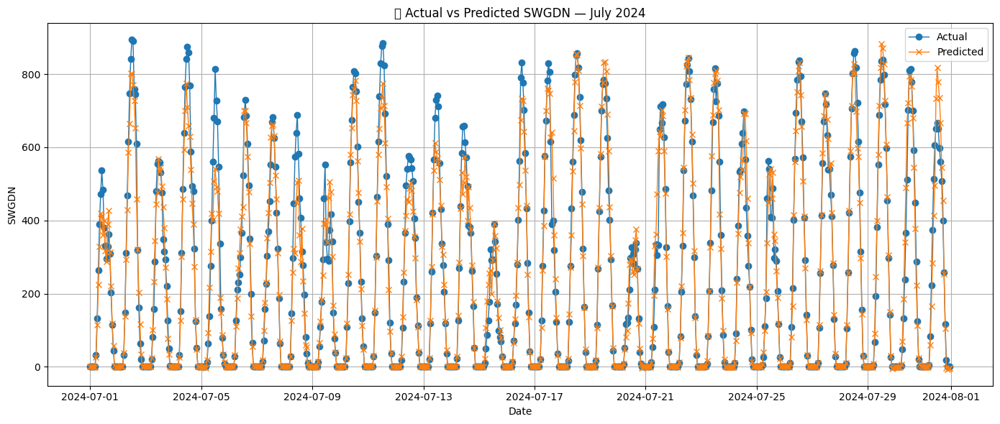

📅 Plotting August 2024...


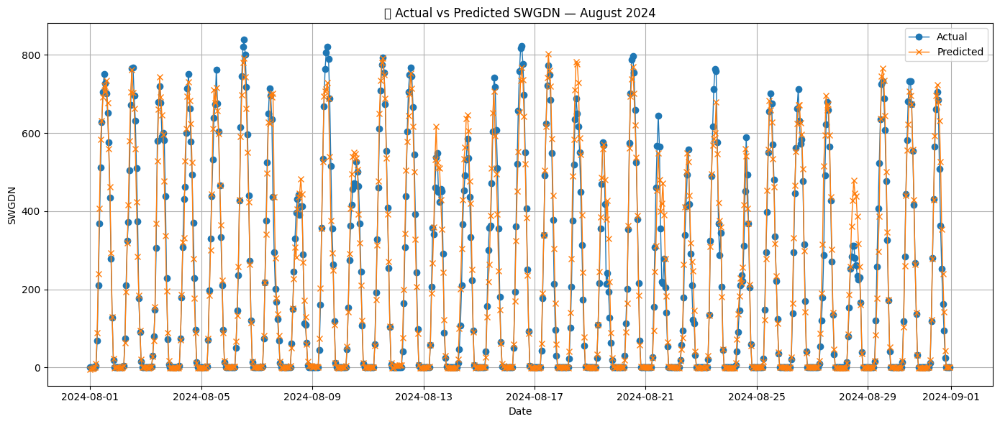

📅 Plotting September 2024...


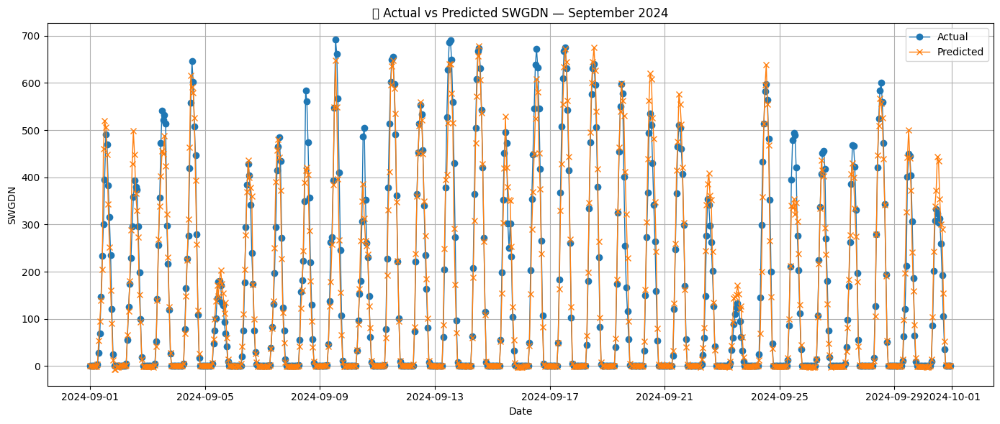

📅 Plotting October 2024...


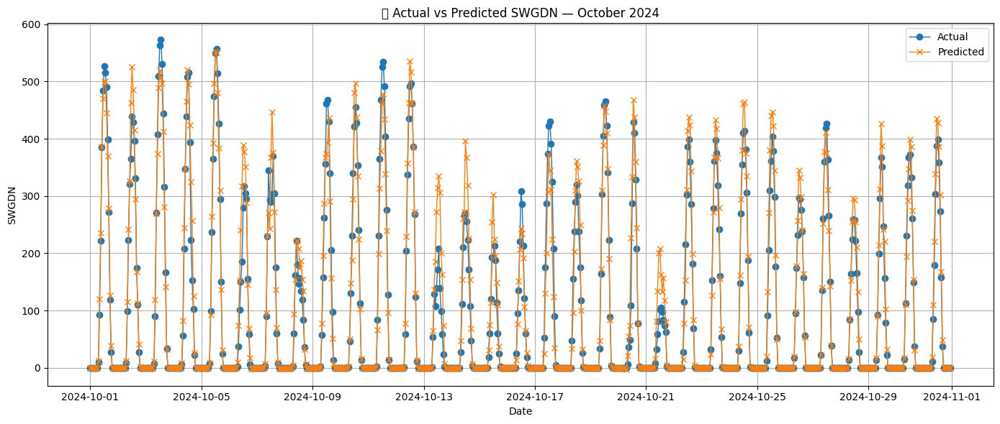

📅 Plotting November 2024...


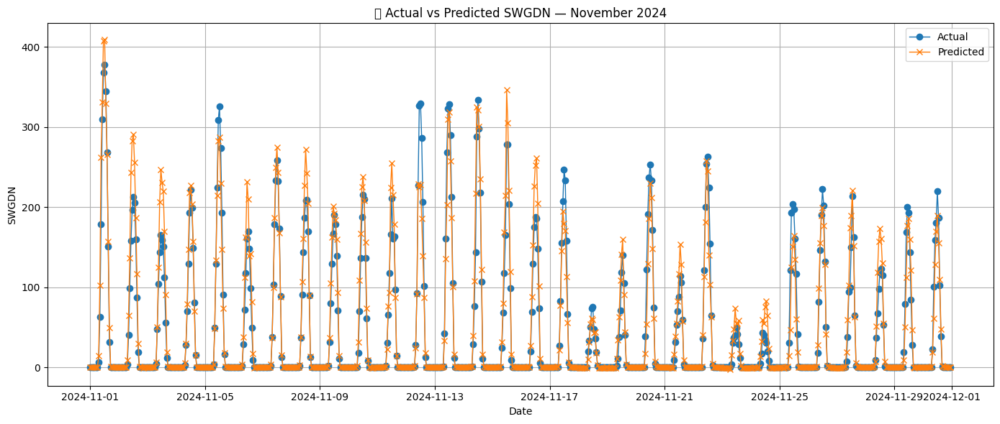

📅 Plotting December 2024...


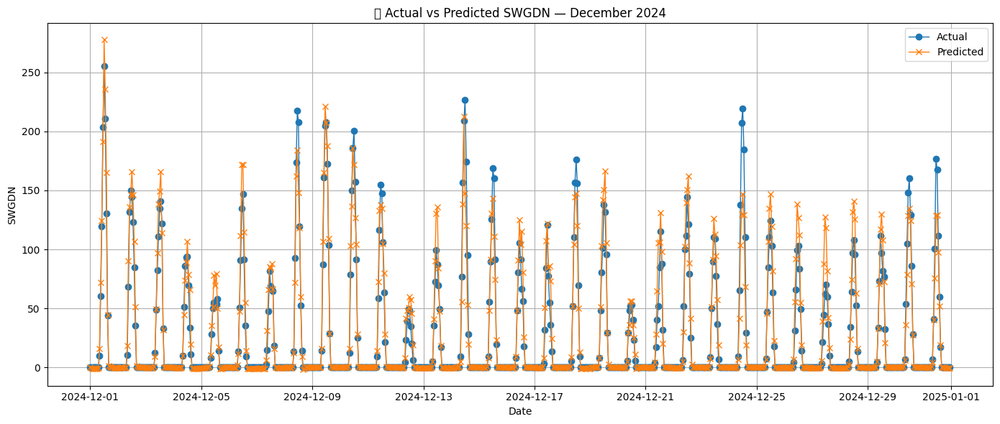

In [24]:
plot_predictions_by_month(
    df_original=df,
    y_test=y_test,
    y_pred=y_pred,
    y_scaler=y_scaler,
    X_train_len=len(X_train),
    input_hours=48,
    forecast_horizon=24
)


## LSTM

In [25]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np


In [26]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Example config
input_hours = 48
forecast_horizon = 24

# Step 1: Prepare Data
X, y, X_scaler, y_scaler, feature_names = prepare_multivariate_timeseries_data(
    df,
    input_hours=input_hours,
    forecast_horizon=forecast_horizon
)

# Step 2: Train/test split
X_train, X_test, y_train, y_test = split_data(X, y, train_ratio=0.8)

# Step 3: Reshape X for LSTM
n_samples, n_features = X_train.shape
n_lag_features = input_hours  # lags for target_col
n_static_features = n_features - input_hours

# Reshape only the lag features to 3D [samples, timesteps, 1]
X_train_lag = X_train[:, :input_hours].reshape(-1, input_hours, 1)
X_test_lag = X_test[:, :input_hours].reshape(-1, input_hours, 1)

# Optionally concatenate static features to last timestep
if n_static_features > 0:
    X_train_static = X_train[:, input_hours:]
    X_test_static = X_test[:, input_hours:]
else:
    X_train_static = X_test_static = None

# Step 4: Build LSTM Model
model = Sequential()
model.add(LSTM(64, input_shape=(input_hours, 1), return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(32, activation='relu'))
model.add(Dense(1))
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

print("🚀 Training LSTM...")
history = model.fit(X_train_lag, y_train, epochs=20, batch_size=32, validation_split=0.1, verbose=1)

# Step 5: Predict
y_pred = model.predict(X_test_lag)

# Step 6: Inverse Transform
y_test_inv = y_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
y_pred_inv = y_scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()

# Step 7: Evaluation
mae = mean_absolute_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
r2 = r2_score(y_test_inv, y_pred_inv)

print("\n📊 Evaluation Results (LSTM):")
print(f"Input Hours: {input_hours}")
print(f"Forecast Horizon: {forecast_horizon}")
print(f"✅ MAE  : {mae:.4f}")
print(f"✅ RMSE : {rmse:.4f}")
print(f"✅ R²    : {r2:.4f}")


🚀 Training LSTM...
Epoch 1/20


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1971/1971 ━━━━━━━━━━━━━━━━━━━━ 45s 22ms/step - loss: 0.0122 - val_loss: 0.0086
Epoch 2/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 83s 23ms/step - loss: 0.0085 - val_loss: 0.0076
Epoch 3/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 82s 23ms/step - loss: 0.0081 - val_loss: 0.0076
Epoch 4/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 44s 22ms/step - loss: 0.0079 - val_loss: 0.0075
Epoch 5/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 83s 23ms/step - loss: 0.0079 - val_loss: 0.0074
Epoch 6/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 82s 23ms/step - loss: 0.0077 - val_loss: 0.0075
Epoch 7/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 45s 23ms/step - loss: 0.0077 - val_loss: 0.0075
Epoch 8/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 45s 23ms/step - loss: 0.0075 - val_loss: 0.0072
Epoch 9/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 81s 22ms/step - loss: 0.0074 - val_loss: 0.0073
Epoch 10/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 44s 22ms/step - loss: 0.0075 - val_loss: 0.0073
Epoch 11/20
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 44s 22ms/step - loss: 0.0072 - val_loss: 0.0071
Epoch 12/20
1971/19

📅 Plotting January 2023...


/tmp/ipython-input-3473602009.py:37: UserWarning: Glyph 127780 (\N{WHITE SUN WITH SMALL CLOUD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127780 (\N{WHITE SUN WITH SMALL CLOUD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


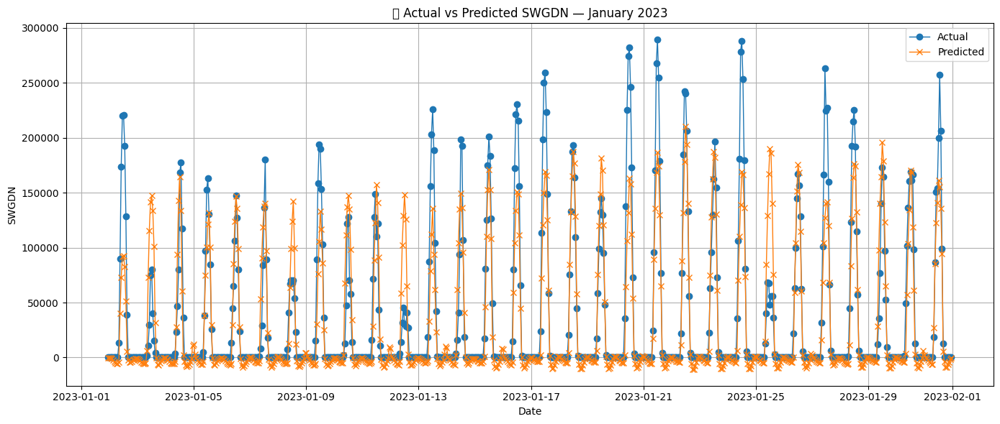

📅 Plotting February 2023...


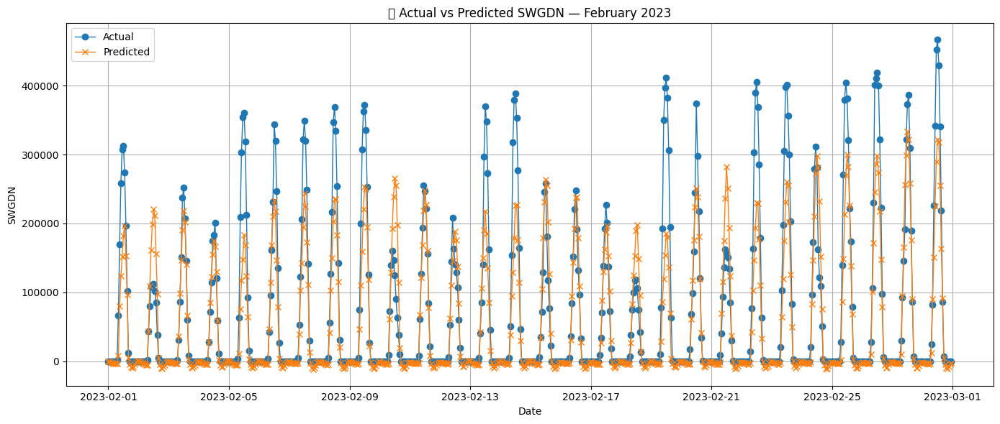

📅 Plotting March 2023...


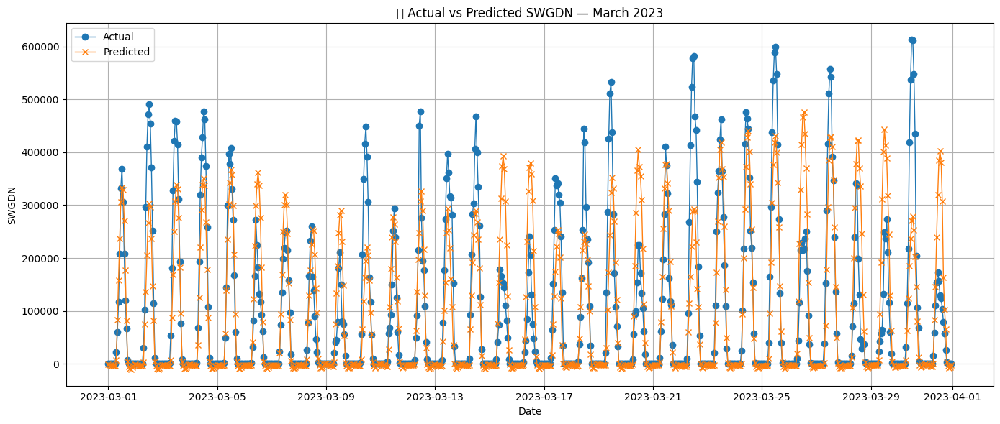

📅 Plotting April 2023...


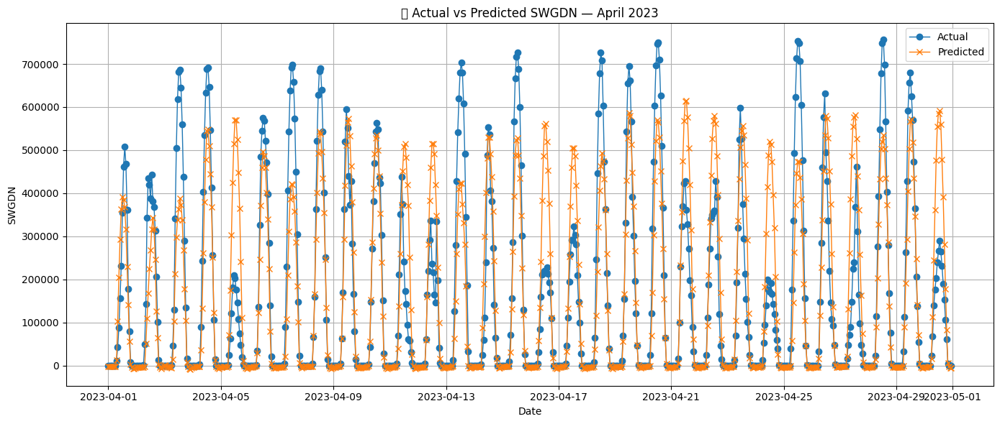

📅 Plotting May 2023...


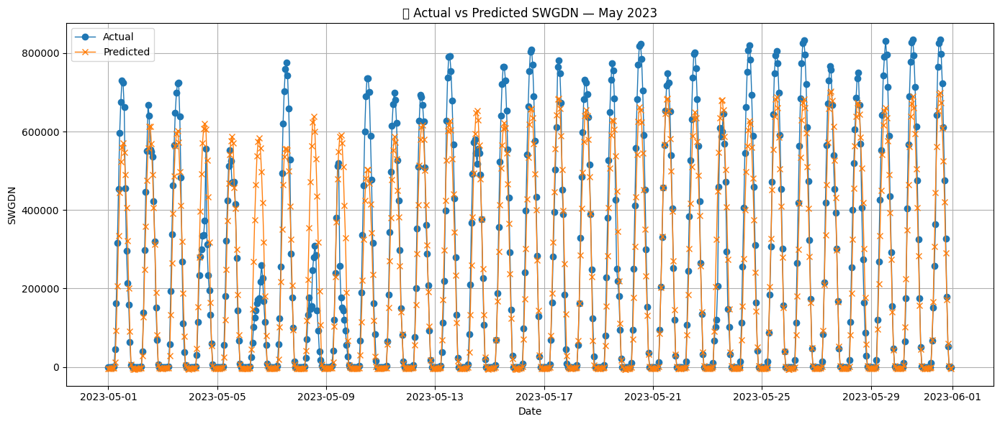

📅 Plotting June 2023...


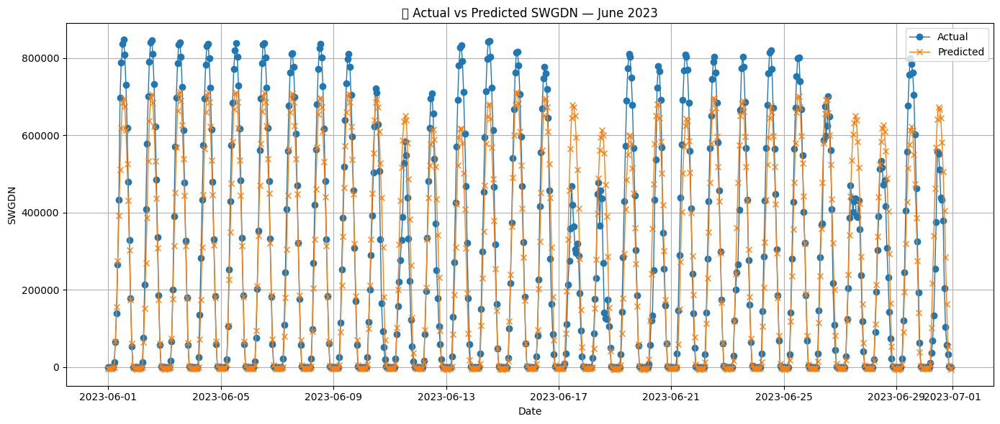

📅 Plotting July 2023...


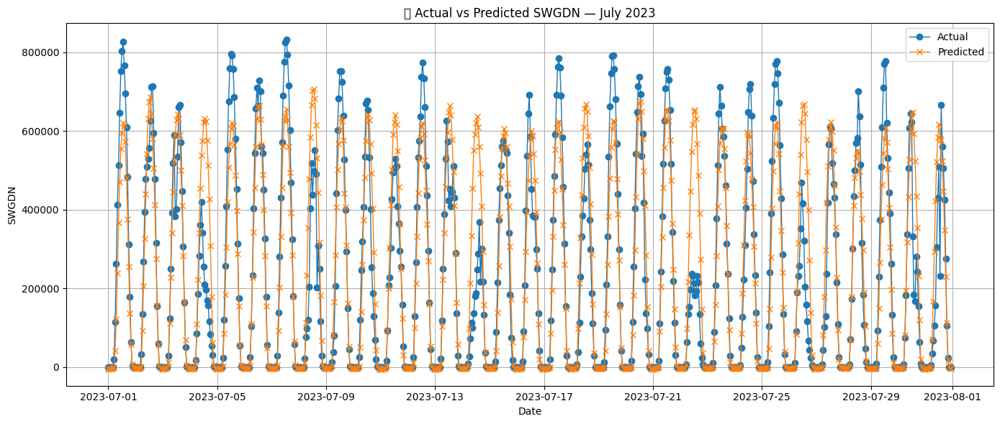

📅 Plotting August 2023...


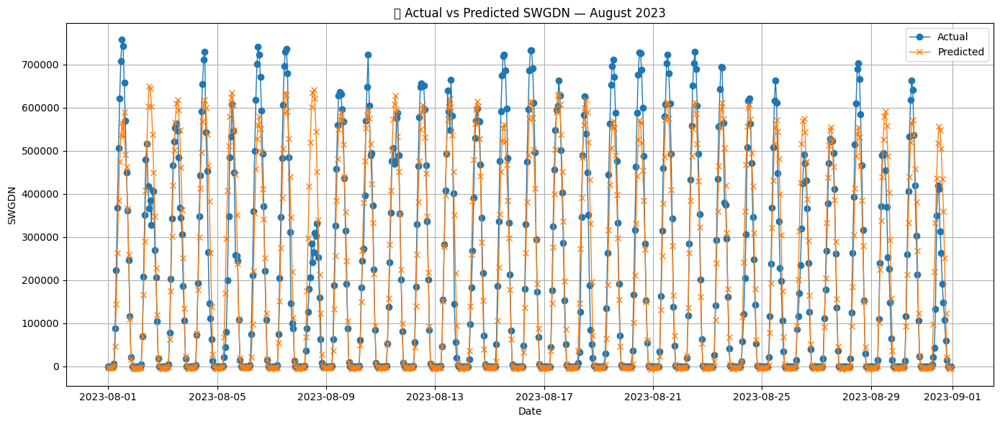

📅 Plotting September 2023...


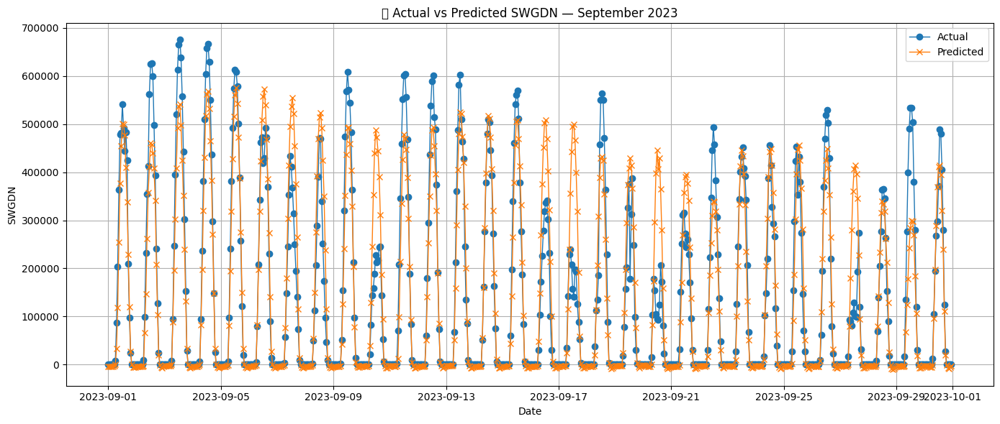

📅 Plotting October 2023...


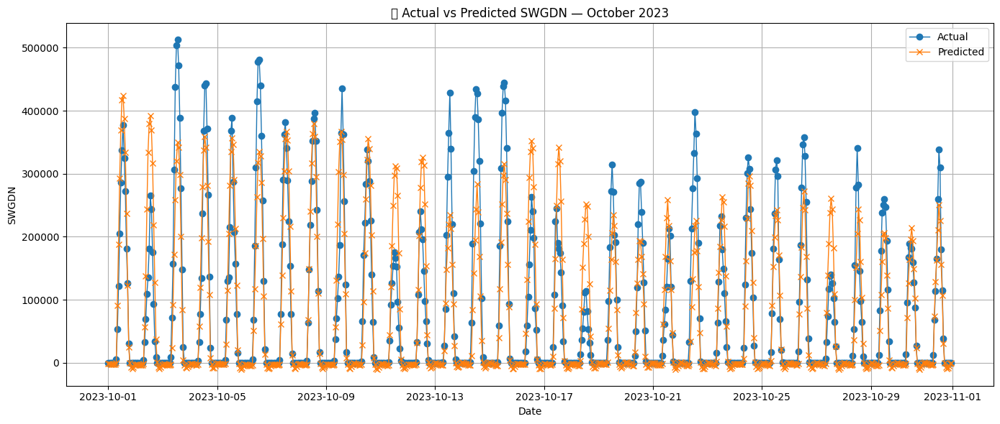

📅 Plotting November 2023...


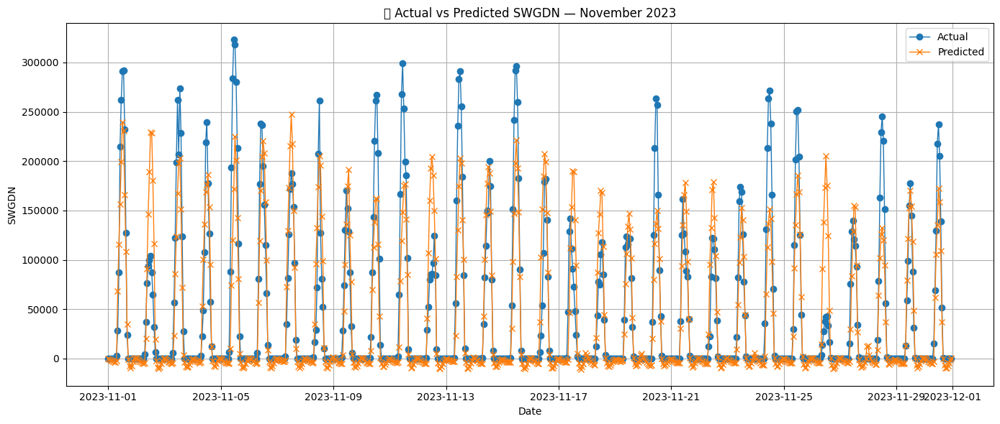

📅 Plotting December 2023...


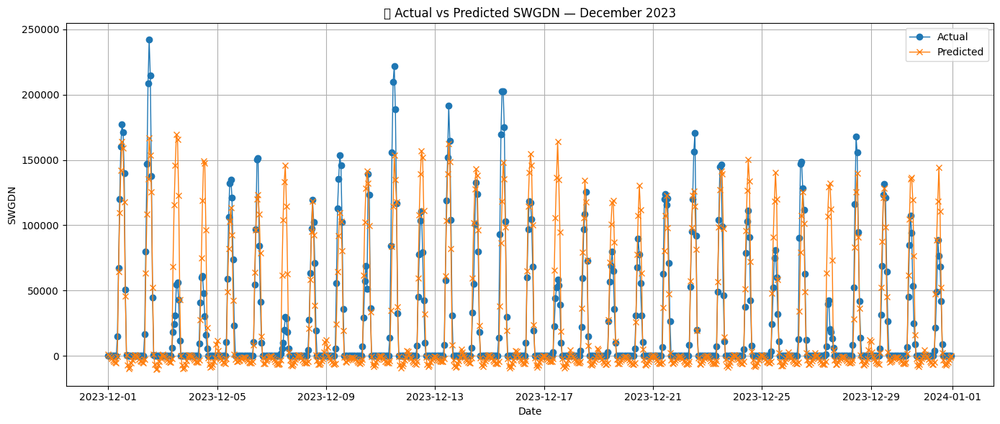

📅 Plotting January 2024...


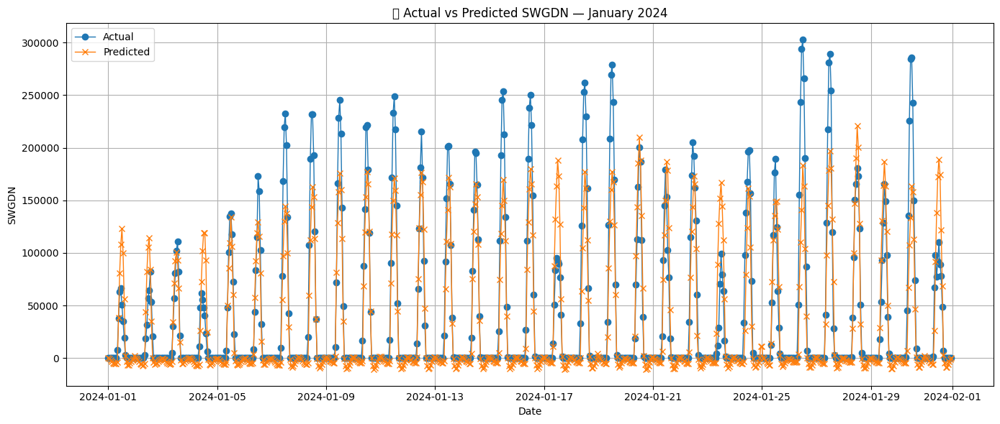

📅 Plotting February 2024...


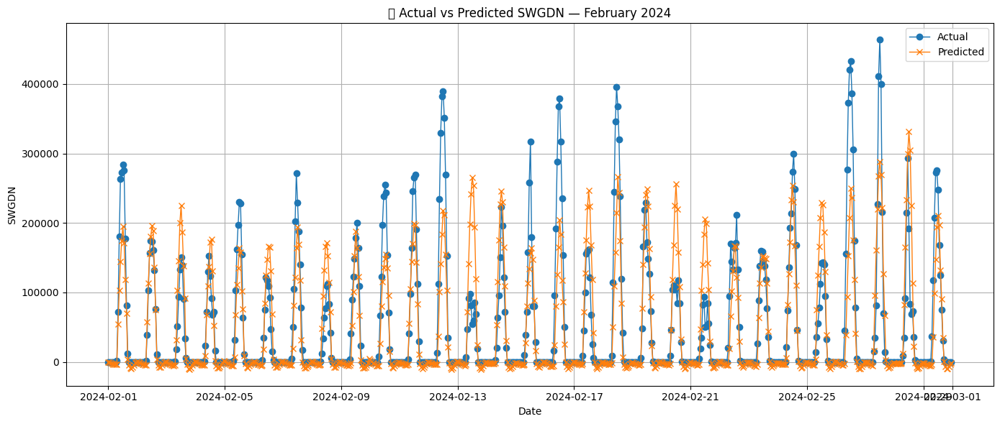

📅 Plotting March 2024...


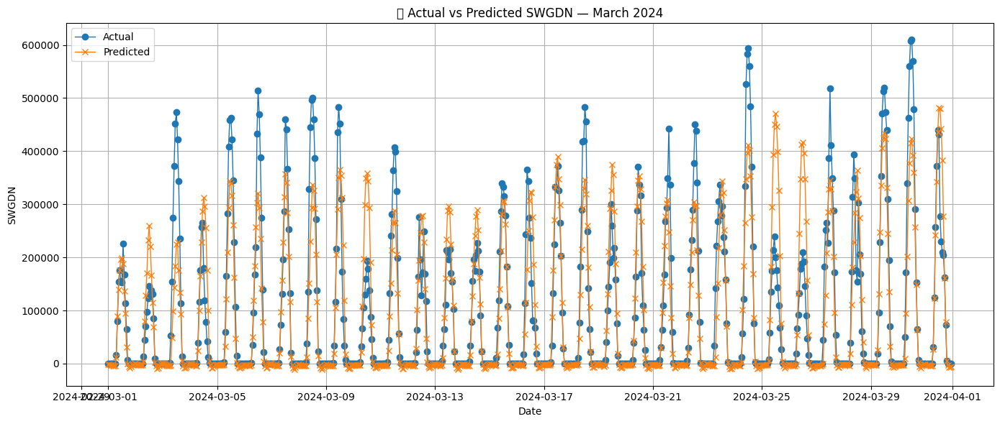

📅 Plotting April 2024...


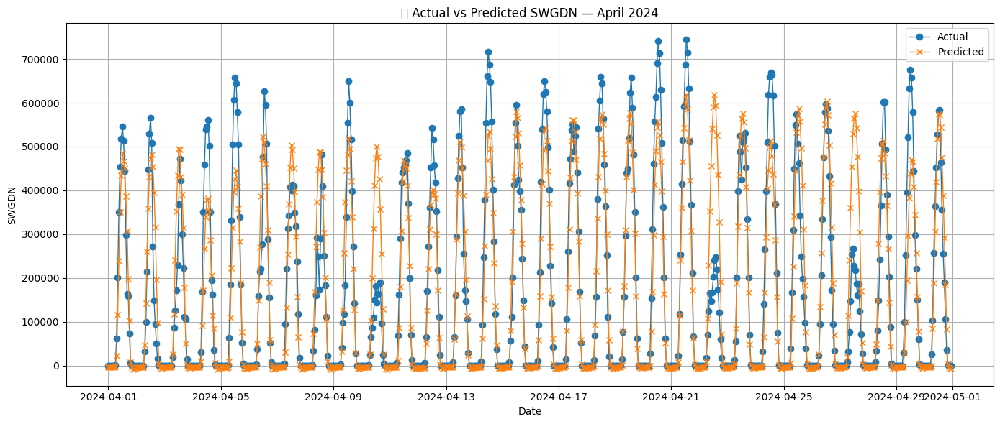

📅 Plotting May 2024...


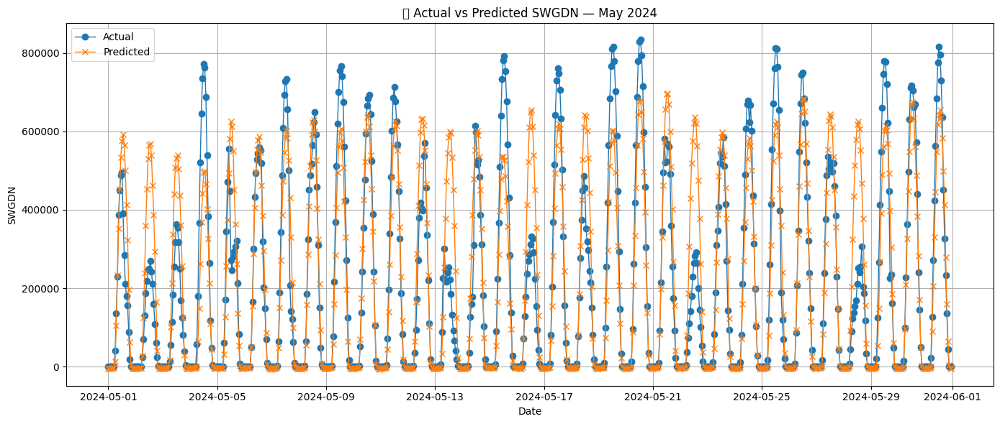

📅 Plotting June 2024...


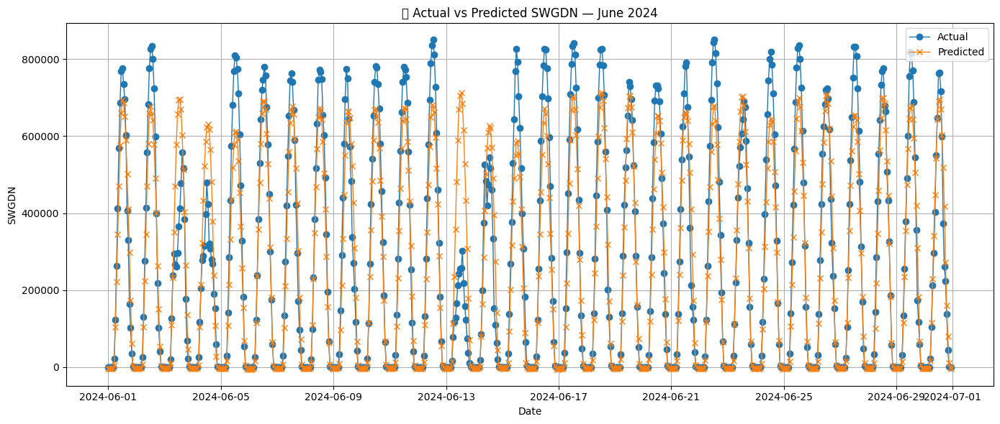

📅 Plotting July 2024...


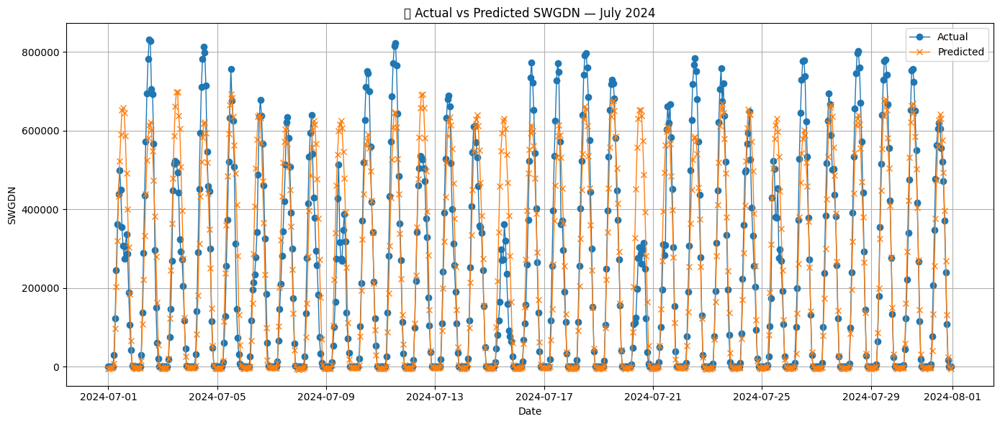

📅 Plotting August 2024...


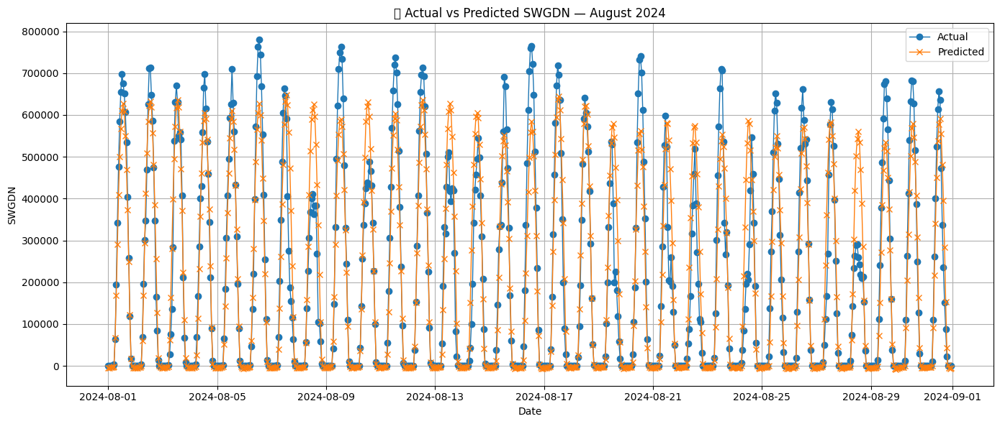

📅 Plotting September 2024...


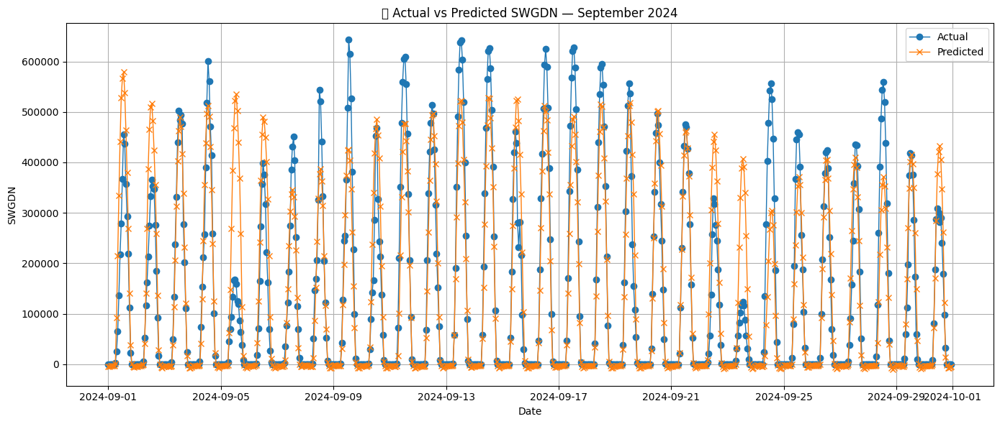

📅 Plotting October 2024...


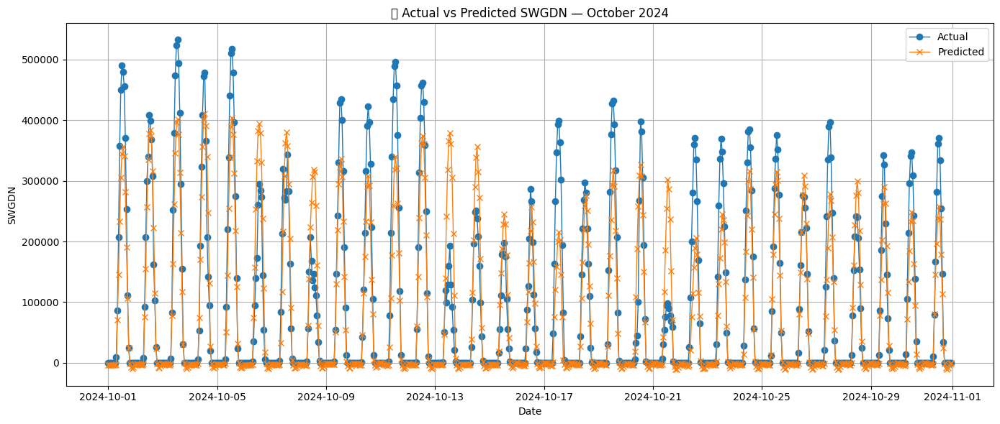

📅 Plotting November 2024...


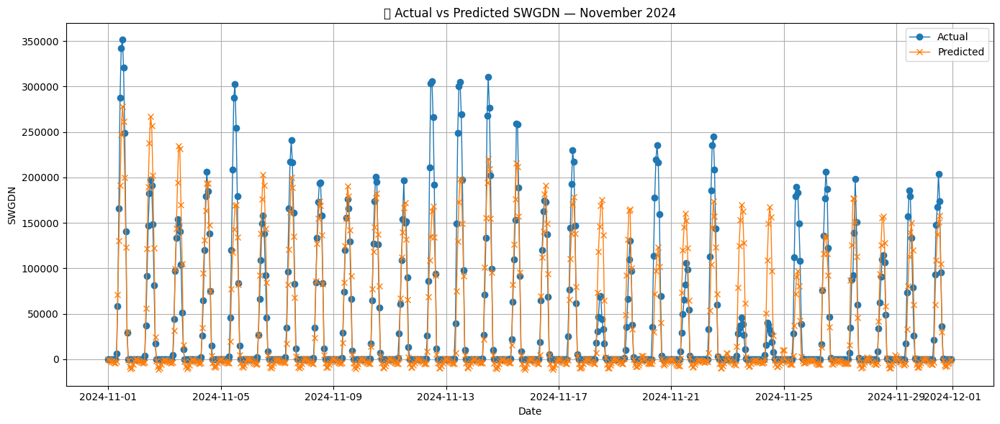

📅 Plotting December 2024...


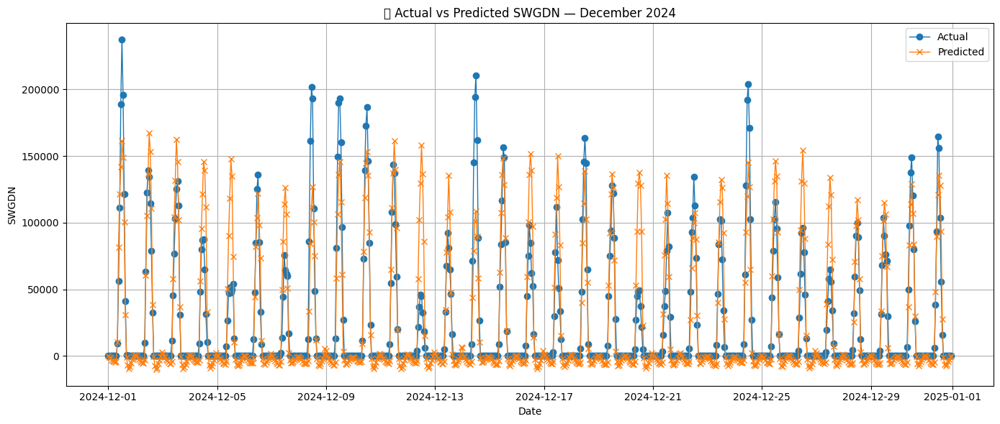

In [27]:
plot_predictions_by_month(
    df_original=df,
    y_test=y_test_inv,
    y_pred=y_pred_inv,
    y_scaler=y_scaler,
    X_train_len=len(X_train),
    input_hours=48,
    forecast_horizon=24
)


🚀 Training LSTM with Early Stopping...
Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1971/1971 ━━━━━━━━━━━━━━━━━━━━ 100s 49ms/step - loss: 0.0122 - val_loss: 0.0105
Epoch 2/100
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 134s 45ms/step - loss: 0.0092 - val_loss: 0.0097
Epoch 3/100
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 93s 47ms/step - loss: 0.0089 - val_loss: 0.0091
Epoch 4/100
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 144s 48ms/step - loss: 0.0082 - val_loss: 0.0075
Epoch 5/100
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 140s 47ms/step - loss: 0.0080 - val_loss: 0.0083
Epoch 6/100
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 92s 47ms/step - loss: 0.0079 - val_loss: 0.0113
Epoch 7/100
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 143s 47ms/step - loss: 0.0077 - val_loss: 0.0082
Epoch 8/100
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 139s 46ms/step - loss: 0.0076 - val_loss: 0.0083
Epoch 9/100
1971/1971 ━━━━━━━━━━━━━━━━━━━━ 144s 47ms/step - loss: 0.0074 - val_loss: 0.0107
548/548 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step

📊 Evaluation Results (LSTM):
Input Hours: 48
Forecast Horizon: 24
✅ MAE  : 43.3160
✅ RMSE : 84.4546
✅ R²    : 0.8555


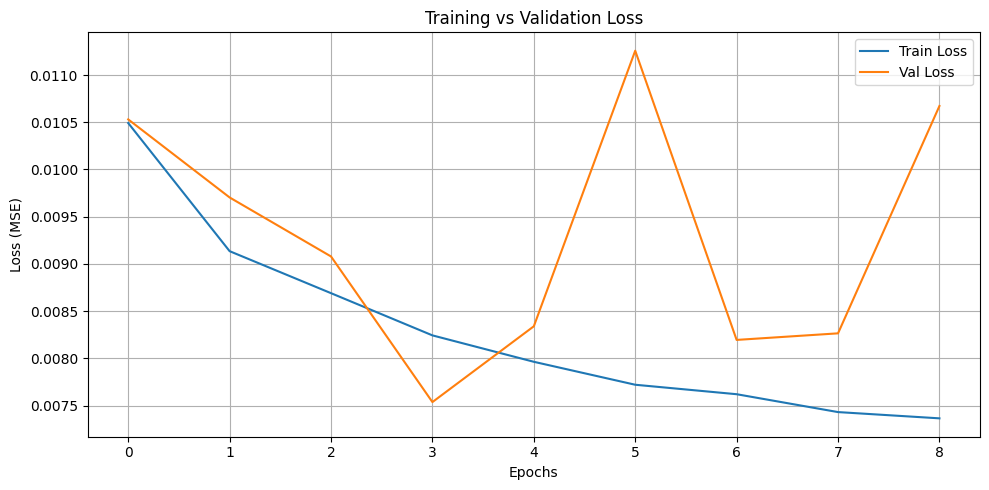

In [28]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping  # 👈
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Prepare Data
X, y, X_scaler, y_scaler, feature_names = prepare_multivariate_timeseries_data(
    df,
    input_hours=48,
    forecast_horizon=24
)

# Step 2: Train/test split
def split_data(X, y, train_ratio=0.8):
    split_index = int(len(X) * train_ratio)
    return X[:split_index], X[split_index:], y[:split_index], y[split_index:]

X_train, X_test, y_train, y_test = split_data(X, y, train_ratio=0.8)

# Step 3: Reshape X for LSTM
n_samples, n_features = X_train.shape
n_lag_features = 48
n_static_features = n_features - n_lag_features

# Lag features only for LSTM
X_train_lag = X_train[:, :n_lag_features].reshape(-1, n_lag_features, 1)
X_test_lag = X_test[:, :n_lag_features].reshape(-1, n_lag_features, 1)

# Optional: static features (not used here, could be added to dense layers)
X_train_static = X_train[:, n_lag_features:] if n_static_features > 0 else None
X_test_static = X_test[:, n_lag_features:] if n_static_features > 0 else None

# Step 4: Build LSTM Model
model = Sequential()
model.add(LSTM(64, input_shape=(n_lag_features, 1), return_sequences=True))
model.add(BatchNormalization())  # 👈 helps training stability
model.add(Dropout(0.2))

model.add(LSTM(32, return_sequences=False))
model.add(Dropout(0.2))

model.add(Dense(32, activation='relu'))
model.add(Dense(1))

model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Early stopping callback
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Optional: learning rate scheduler
# from keras.callbacks import ReduceLROnPlateau
# lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

# Step 5: Train the model
print("🚀 Training LSTM with Early Stopping...")
history = model.fit(
    X_train_lag,
    y_train,
    epochs=100,  # Higher with early stopping
    batch_size=32,
    validation_split=0.1,
    verbose=1,
    callbacks=[early_stop]
)

# Step 6: Predict
y_pred = model.predict(X_test_lag)

# Step 7: Inverse transform
y_test_inv = y_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
y_pred_inv = y_scaler.inverse_transform(y_pred.reshape(-1, 1)).flatten()

# Step 8: Evaluation
mae = mean_absolute_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
r2 = r2_score(y_test_inv, y_pred_inv)

print("\n📊 Evaluation Results (LSTM):")
print(f"Input Hours: {n_lag_features}")
print(f"Forecast Horizon: 24")
print(f"✅ MAE  : {mae:.4f}")
print(f"✅ RMSE : {rmse:.4f}")
print(f"✅ R²    : {r2:.4f}")

# Step 9: Plot training history
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss (MSE)")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
